# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 0vzj3mc2
Name: trim-capybara-604
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/0vzj3mc2
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_004258-0vzj3mc2/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 218,393,450,190,387,303,550,135,481,379,430,370,246,281,44,225,440,293,289,526,240,271,150,54,323,144,114,286,92,73,191,204,48,310,226,171,268,145,93,196,370,445,339,965,149,394,170,197,283,312,227,138,376,271,269,369,318,625,301,306,232,583,245,150,263,336,288,721,358,340,261,373,356,366,128,229,222,144,55,115,193,501,306,282,349,217,150,234,377,176,136,105,266,392,155,162,448,75,154,296,172,378,101,254,199,215,335,129,148,303,277,111,110,365,339,359,261,46,38,224,228,265,76,206,307,245,189,245,291,211,956,265,195,534,303,160,494,340,515,457,196,457,443,269,366,240,364,225,306,289,269,244,260,386,401,255,237,191,148,613,243,224,135,145,177,158,538,259,380,213,273,400,604,401,305,253,219,243,172,184,211,190,208,230,600,334,329,364,355,7145,414,273,195,168,359,180,259,277,151,32

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 58,88,108,42,108,76,137,40,101,84,103,94,55,77,15,39,122,72,59,137,66,64,38,10,87,40,20,78,34,34,39,41,16,102,60,40,63,35,21,41,98,121,76,254,30,81,45,44,72,86,58,40,94,57,60,109,69,162,81,60,58,148,52,33,59,89,66,184,83,105,63,86,95,79,31,55,55,47,16,36,54,129,76,63,77,55,42,61,102,40,39,25,63,102,37,38,104,21,39,72,43,85,25,49,38,59,75,38,35,65,72,29,31,80,88,85,66,8,21,42,50,64,20,48,88,66,48,53,70,52,241,72,46,113,72,32,129,92,111,124,65,114,136,69,85,60,80,77,57,77,70,58,59,114,96,58,61,46,44,157,67,69,41,41,38,44,129,56,100,56,72,112,146,112,67,69,65,48,46,38,53,46,47,75,163,100,83,82,108,1762,116,76,50,43,87,37,72,55,49,78,28,83,59,68,85,126,70,51,97,20,12,44,75,74,19,54,73,72,37,53,71,65,57,54,62,50,78,61,41,65,59,110,45,75,16,49,35,147,117,125,92,65,66,55,191,123,16,

Epoch 1/600:   0%|          | 1/600 [00:15<2:37:53, 15.82s/it]

Epoch 1/600:   0%|          | 1/600 [00:15<2:37:53, 15.82s/it, v_num=c2_1, total_loss_train=1.91e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 1/600 [00:15<2:37:53, 15.82s/it, v_num=c2_1, total_loss_train=1.91e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 2/600 [00:21<1:39:51, 10.02s/it, v_num=c2_1, total_loss_train=1.91e+3, kl_local_train=64.7]

Epoch 2/600:   0%|          | 2/600 [00:21<1:39:51, 10.02s/it, v_num=c2_1, total_loss_train=1.34e+3, kl_local_train=81.7]

Epoch 3/600:   0%|          | 2/600 [00:21<1:39:51, 10.02s/it, v_num=c2_1, total_loss_train=1.34e+3, kl_local_train=81.7]

Epoch 3/600:   0%|          | 3/600 [00:27<1:21:17,  8.17s/it, v_num=c2_1, total_loss_train=1.34e+3, kl_local_train=81.7]

Epoch 3/600:   0%|          | 3/600 [00:27<1:21:17,  8.17s/it, v_num=c2_1, total_loss_train=1.32e+3, kl_local_train=78]  

Epoch 4/600:   0%|          | 3/600 [00:27<1:21:17,  8.17s/it, v_num=c2_1, total_loss_train=1.32e+3, kl_local_train=78]

Epoch 4/600:   1%|          | 4/600 [00:33<1:12:26,  7.29s/it, v_num=c2_1, total_loss_train=1.32e+3, kl_local_train=78]

Epoch 4/600:   1%|          | 4/600 [00:33<1:12:26,  7.29s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=66.6]

Epoch 5/600:   1%|          | 4/600 [00:33<1:12:26,  7.29s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=66.6]

Epoch 5/600:   1%|          | 5/600 [00:39<1:07:26,  6.80s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=66.6]

Epoch 5/600:   1%|          | 5/600 [00:39<1:07:26,  6.80s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=45.1]

Epoch 6/600:   1%|          | 5/600 [00:39<1:07:26,  6.80s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=45.1]

Epoch 6/600:   1%|          | 6/600 [00:45<1:04:24,  6.51s/it, v_num=c2_1, total_loss_train=1.31e+3, kl_local_train=45.1]

Epoch 6/600:   1%|          | 6/600 [00:45<1:04:24,  6.51s/it, v_num=c2_1, total_loss_train=1.3e+3, kl_local_train=34.2] 

Epoch 7/600:   1%|          | 6/600 [00:45<1:04:24,  6.51s/it, v_num=c2_1, total_loss_train=1.3e+3, kl_local_train=34.2]

Epoch 7/600:   1%|          | 7/600 [00:51<1:02:29,  6.32s/it, v_num=c2_1, total_loss_train=1.3e+3, kl_local_train=34.2]

Epoch 7/600:   1%|          | 7/600 [00:51<1:02:29,  6.32s/it, v_num=c2_1, total_loss_train=1.28e+3, kl_local_train=38.4]

Epoch 8/600:   1%|          | 7/600 [00:51<1:02:29,  6.32s/it, v_num=c2_1, total_loss_train=1.28e+3, kl_local_train=38.4]

Epoch 8/600:   1%|▏         | 8/600 [00:57<1:01:12,  6.20s/it, v_num=c2_1, total_loss_train=1.28e+3, kl_local_train=38.4]

Epoch 8/600:   1%|▏         | 8/600 [00:57<1:01:12,  6.20s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=43.3]

Epoch 9/600:   1%|▏         | 8/600 [00:57<1:01:12,  6.20s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=43.3]

Epoch 9/600:   2%|▏         | 9/600 [01:03<1:00:16,  6.12s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=43.3]

Epoch 9/600:   2%|▏         | 9/600 [01:03<1:00:16,  6.12s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=49.3]

Epoch 10/600:   2%|▏         | 9/600 [01:03<1:00:16,  6.12s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=49.3]

Epoch 10/600:   2%|▏         | 10/600 [01:09<59:41,  6.07s/it, v_num=c2_1, total_loss_train=1.27e+3, kl_local_train=49.3] 

Epoch 10/600:   2%|▏         | 10/600 [01:09<59:41,  6.07s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=57.6]

Epoch 11/600:   2%|▏         | 10/600 [01:09<59:41,  6.07s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=57.6]

Epoch 11/600:   2%|▏         | 11/600 [01:15<59:24,  6.05s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=57.6]

Epoch 11/600:   2%|▏         | 11/600 [01:15<59:24,  6.05s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 12/600:   2%|▏         | 11/600 [01:15<59:24,  6.05s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 12/600:   2%|▏         | 12/600 [01:21<58:58,  6.02s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 12/600:   2%|▏         | 12/600 [01:21<58:58,  6.02s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=67.7]

Epoch 13/600:   2%|▏         | 12/600 [01:21<58:58,  6.02s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=67.7]

Epoch 13/600:   2%|▏         | 13/600 [01:27<58:42,  6.00s/it, v_num=c2_1, total_loss_train=1.26e+3, kl_local_train=67.7]

Epoch 13/600:   2%|▏         | 13/600 [01:27<58:42,  6.00s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=69.2]

Epoch 14/600:   2%|▏         | 13/600 [01:27<58:42,  6.00s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=69.2]

Epoch 14/600:   2%|▏         | 14/600 [01:33<58:24,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=69.2]

Epoch 14/600:   2%|▏         | 14/600 [01:33<58:24,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 15/600:   2%|▏         | 14/600 [01:33<58:24,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 15/600:   2%|▎         | 15/600 [01:39<58:21,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=71.4]

Epoch 15/600:   2%|▎         | 15/600 [01:39<58:21,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=74]  

Epoch 16/600:   2%|▎         | 15/600 [01:39<58:21,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=74]

Epoch 16/600:   3%|▎         | 16/600 [01:45<58:16,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=74]

Epoch 16/600:   3%|▎         | 16/600 [01:45<58:16,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=77.7]

Epoch 17/600:   3%|▎         | 16/600 [01:45<58:16,  5.99s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=77.7]

Epoch 17/600:   3%|▎         | 17/600 [01:51<58:07,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=77.7]

Epoch 17/600:   3%|▎         | 17/600 [01:51<58:07,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=82.7]

Epoch 18/600:   3%|▎         | 17/600 [01:51<58:07,  5.98s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=82.7]

Epoch 18/600:   3%|▎         | 18/600 [01:57<57:51,  5.96s/it, v_num=c2_1, total_loss_train=1.25e+3, kl_local_train=82.7]

Epoch 18/600:   3%|▎         | 18/600 [01:57<57:51,  5.96s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=83.7]

Epoch 19/600:   3%|▎         | 18/600 [01:57<57:51,  5.96s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=83.7]

Epoch 19/600:   3%|▎         | 19/600 [02:03<57:39,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=83.7]

Epoch 19/600:   3%|▎         | 19/600 [02:03<57:39,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.4]

Epoch 20/600:   3%|▎         | 19/600 [02:03<57:39,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.4]

Epoch 20/600:   3%|▎         | 20/600 [02:08<57:31,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.4]

Epoch 20/600:   3%|▎         | 20/600 [02:08<57:31,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=90]  

Epoch 21/600:   3%|▎         | 20/600 [02:08<57:31,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=90]

Epoch 21/600:   4%|▎         | 21/600 [02:14<57:26,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=90]

Epoch 21/600:   4%|▎         | 21/600 [02:14<57:26,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.9]

Epoch 22/600:   4%|▎         | 21/600 [02:14<57:26,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.9]

Epoch 22/600:   4%|▎         | 22/600 [02:20<57:17,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=86.9]

Epoch 22/600:   4%|▎         | 22/600 [02:20<57:17,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.8]

Epoch 23/600:   4%|▎         | 22/600 [02:20<57:17,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.8]

Epoch 23/600:   4%|▍         | 23/600 [02:26<57:10,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.8]

Epoch 23/600:   4%|▍         | 23/600 [02:26<57:10,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.1]

Epoch 24/600:   4%|▍         | 23/600 [02:26<57:10,  5.95s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.1]

Epoch 24/600:   4%|▍         | 24/600 [02:32<57:04,  5.94s/it, v_num=c2_1, total_loss_train=1.24e+3, kl_local_train=93.1]

Epoch 24/600:   4%|▍         | 24/600 [02:32<57:04,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 25/600:   4%|▍         | 24/600 [02:32<57:04,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 25/600:   4%|▍         | 25/600 [02:38<56:55,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 25/600:   4%|▍         | 25/600 [02:38<56:55,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 25/600 [02:38<56:55,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 26/600 [02:44<56:48,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=96.5]

Epoch 26/600:   4%|▍         | 26/600 [02:44<56:48,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=97.8]

Epoch 27/600:   4%|▍         | 26/600 [02:44<56:48,  5.94s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=97.8]

Epoch 27/600:   4%|▍         | 27/600 [02:50<56:55,  5.96s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=97.8]

Epoch 27/600:   4%|▍         | 27/600 [02:50<56:55,  5.96s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=95.8]

Epoch 28/600:   4%|▍         | 27/600 [02:50<56:55,  5.96s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=95.8]

Epoch 28/600:   5%|▍         | 28/600 [02:56<57:01,  5.98s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=95.8]

Epoch 28/600:   5%|▍         | 28/600 [02:56<57:01,  5.98s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 29/600:   5%|▍         | 28/600 [02:56<57:01,  5.98s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 29/600:   5%|▍         | 29/600 [03:02<56:59,  5.99s/it, v_num=c2_1, total_loss_train=1.23e+3, kl_local_train=92.1]

Epoch 29/600:   5%|▍         | 29/600 [03:02<56:59,  5.99s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=92.3]

Epoch 30/600:   5%|▍         | 29/600 [03:02<56:59,  5.99s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=92.3]

Epoch 30/600:   5%|▌         | 30/600 [03:08<56:45,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=92.3]

Epoch 30/600:   5%|▌         | 30/600 [03:08<56:45,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 31/600:   5%|▌         | 30/600 [03:08<56:45,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 31/600:   5%|▌         | 31/600 [03:14<56:40,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 31/600:   5%|▌         | 31/600 [03:14<56:40,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=88.5]

Epoch 32/600:   5%|▌         | 31/600 [03:14<56:40,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=88.5]

Epoch 32/600:   5%|▌         | 32/600 [03:20<56:34,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=88.5]

Epoch 32/600:   5%|▌         | 32/600 [03:20<56:34,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=87.7]

Epoch 33/600:   5%|▌         | 32/600 [03:20<56:34,  5.98s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=87.7]

Epoch 33/600:   6%|▌         | 33/600 [03:26<56:19,  5.96s/it, v_num=c2_1, total_loss_train=1.22e+3, kl_local_train=87.7]

Epoch 33/600:   6%|▌         | 33/600 [03:26<56:19,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=93.2]

Epoch 34/600:   6%|▌         | 33/600 [03:26<56:19,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=93.2]

Epoch 34/600:   6%|▌         | 34/600 [03:32<56:14,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=93.2]

Epoch 34/600:   6%|▌         | 34/600 [03:32<56:14,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=95.9]

Epoch 35/600:   6%|▌         | 34/600 [03:32<56:14,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=95.9]

Epoch 35/600:   6%|▌         | 35/600 [03:38<56:06,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=95.9]

Epoch 35/600:   6%|▌         | 35/600 [03:38<56:06,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=96.1]

Epoch 36/600:   6%|▌         | 35/600 [03:38<56:06,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=96.1]

Epoch 36/600:   6%|▌         | 36/600 [03:44<56:05,  5.97s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=96.1]

Epoch 36/600:   6%|▌         | 36/600 [03:44<56:05,  5.97s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=98.8]

Epoch 37/600:   6%|▌         | 36/600 [03:44<56:05,  5.97s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=98.8]

Epoch 37/600:   6%|▌         | 37/600 [03:50<55:56,  5.96s/it, v_num=c2_1, total_loss_train=1.21e+3, kl_local_train=98.8]

Epoch 37/600:   6%|▌         | 37/600 [03:50<55:56,  5.96s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.3] 

Epoch 38/600:   6%|▌         | 37/600 [03:50<55:56,  5.96s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.3]

Epoch 38/600:   6%|▋         | 38/600 [03:56<55:45,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.3]

Epoch 38/600:   6%|▋         | 38/600 [03:56<55:45,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=101] 

Epoch 39/600:   6%|▋         | 38/600 [03:56<55:45,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=101]

Epoch 39/600:   6%|▋         | 39/600 [04:02<55:37,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=101]

Epoch 39/600:   6%|▋         | 39/600 [04:02<55:37,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.9]

Epoch 40/600:   6%|▋         | 39/600 [04:02<55:37,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.9]

Epoch 40/600:   7%|▋         | 40/600 [04:08<55:30,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.9]

Epoch 40/600:   7%|▋         | 40/600 [04:08<55:30,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.1]

Epoch 41/600:   7%|▋         | 40/600 [04:08<55:30,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.1]

Epoch 41/600:   7%|▋         | 41/600 [04:14<55:23,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99.1]

Epoch 41/600:   7%|▋         | 41/600 [04:14<55:23,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99]  

Epoch 42/600:   7%|▋         | 41/600 [04:14<55:23,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99]

Epoch 42/600:   7%|▋         | 42/600 [04:20<55:18,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=99]

Epoch 42/600:   7%|▋         | 42/600 [04:20<55:18,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=100]

Epoch 43/600:   7%|▋         | 42/600 [04:20<55:18,  5.95s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=100]

Epoch 43/600:   7%|▋         | 43/600 [04:25<55:10,  5.94s/it, v_num=c2_1, total_loss_train=1.2e+3, kl_local_train=100]

Epoch 43/600:   7%|▋         | 43/600 [04:25<55:10,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 44/600:   7%|▋         | 43/600 [04:25<55:10,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 44/600:   7%|▋         | 44/600 [04:31<55:09,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 44/600:   7%|▋         | 44/600 [04:31<55:09,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 45/600:   7%|▋         | 44/600 [04:31<55:09,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 45/600:   8%|▊         | 45/600 [04:37<55:02,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=100]

Epoch 45/600:   8%|▊         | 45/600 [04:37<55:02,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 46/600:   8%|▊         | 45/600 [04:37<55:02,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 46/600:   8%|▊         | 46/600 [04:43<55:01,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 46/600:   8%|▊         | 46/600 [04:43<55:01,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=101] 

Epoch 47/600:   8%|▊         | 46/600 [04:43<55:01,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=101]

Epoch 47/600:   8%|▊         | 47/600 [04:49<54:49,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=101]

Epoch 47/600:   8%|▊         | 47/600 [04:49<54:49,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=102]

Epoch 48/600:   8%|▊         | 47/600 [04:49<54:49,  5.95s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=102]

Epoch 48/600:   8%|▊         | 48/600 [04:55<54:38,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=102]

Epoch 48/600:   8%|▊         | 48/600 [04:55<54:38,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 49/600:   8%|▊         | 48/600 [04:55<54:38,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 49/600:   8%|▊         | 49/600 [05:01<54:28,  5.93s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.9]

Epoch 49/600:   8%|▊         | 49/600 [05:01<54:28,  5.93s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.7]

Epoch 50/600:   8%|▊         | 49/600 [05:01<54:28,  5.93s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.7]

Epoch 50/600:   8%|▊         | 50/600 [05:07<54:38,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.7]

Epoch 50/600:   8%|▊         | 50/600 [05:07<54:38,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.6]

Epoch 51/600:   8%|▊         | 50/600 [05:07<54:38,  5.96s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.6]

Epoch 51/600:   8%|▊         | 51/600 [05:13<54:19,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.6]

Epoch 51/600:   8%|▊         | 51/600 [05:13<54:19,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.8]

Epoch 52/600:   8%|▊         | 51/600 [05:13<54:19,  5.94s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.8]

Epoch 52/600:   9%|▊         | 52/600 [05:19<54:32,  5.97s/it, v_num=c2_1, total_loss_train=1.19e+3, kl_local_train=99.8]

Epoch 52/600:   9%|▊         | 52/600 [05:19<54:32,  5.97s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 53/600:   9%|▊         | 52/600 [05:19<54:32,  5.97s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 53/600:   9%|▉         | 53/600 [05:25<54:13,  5.95s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 53/600:   9%|▉         | 53/600 [05:25<54:13,  5.95s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 54/600:   9%|▉         | 53/600 [05:25<54:13,  5.95s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 54/600:   9%|▉         | 54/600 [05:31<53:55,  5.93s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=98.7]

Epoch 54/600:   9%|▉         | 54/600 [05:31<53:55,  5.93s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 55/600:   9%|▉         | 54/600 [05:31<53:55,  5.93s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 55/600:   9%|▉         | 55/600 [05:37<53:42,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 55/600:   9%|▉         | 55/600 [05:37<53:42,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.8]

Epoch 56/600:   9%|▉         | 55/600 [05:37<53:42,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.8]

Epoch 56/600:   9%|▉         | 56/600 [05:43<53:34,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.8]

Epoch 56/600:   9%|▉         | 56/600 [05:43<53:34,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 57/600:   9%|▉         | 56/600 [05:43<53:34,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 57/600:  10%|▉         | 57/600 [05:49<53:28,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.9]

Epoch 57/600:  10%|▉         | 57/600 [05:49<53:28,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.4]

Epoch 58/600:  10%|▉         | 57/600 [05:49<53:28,  5.91s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.4]

Epoch 58/600:  10%|▉         | 58/600 [05:54<53:18,  5.90s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=97.4]

Epoch 58/600:  10%|▉         | 58/600 [05:54<53:18,  5.90s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.1]

Epoch 59/600:  10%|▉         | 58/600 [05:54<53:18,  5.90s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.1]

Epoch 59/600:  10%|▉         | 59/600 [06:00<53:08,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.1]

Epoch 59/600:  10%|▉         | 59/600 [06:00<53:08,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.5]

Epoch 60/600:  10%|▉         | 59/600 [06:00<53:08,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.5]

Epoch 60/600:  10%|█         | 60/600 [06:06<53:00,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.5]

Epoch 60/600:  10%|█         | 60/600 [06:06<53:00,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=96.1]

Epoch 61/600:  10%|█         | 60/600 [06:06<53:00,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=96.1]

Epoch 61/600:  10%|█         | 61/600 [06:12<52:54,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=96.1]

Epoch 61/600:  10%|█         | 61/600 [06:12<52:54,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.7]

Epoch 62/600:  10%|█         | 61/600 [06:12<52:54,  5.89s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.7]

Epoch 62/600:  10%|█         | 62/600 [06:18<52:43,  5.88s/it, v_num=c2_1, total_loss_train=1.18e+3, kl_local_train=96.7]

Epoch 62/600:  10%|█         | 62/600 [06:18<52:43,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95]  

Epoch 63/600:  10%|█         | 62/600 [06:18<52:43,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95]

Epoch 63/600:  10%|█         | 63/600 [06:24<52:35,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95]

Epoch 63/600:  10%|█         | 63/600 [06:24<52:35,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.5]

Epoch 64/600:  10%|█         | 63/600 [06:24<52:35,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.5]

Epoch 64/600:  11%|█         | 64/600 [06:30<52:29,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.5]

Epoch 64/600:  11%|█         | 64/600 [06:30<52:29,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.2]

Epoch 65/600:  11%|█         | 64/600 [06:30<52:29,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.2]

Epoch 65/600:  11%|█         | 65/600 [06:36<52:24,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=95.2]

Epoch 65/600:  11%|█         | 65/600 [06:36<52:24,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.8]

Epoch 66/600:  11%|█         | 65/600 [06:36<52:24,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.8]

Epoch 66/600:  11%|█         | 66/600 [06:41<52:20,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.8]

Epoch 66/600:  11%|█         | 66/600 [06:41<52:20,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.3]

Epoch 67/600:  11%|█         | 66/600 [06:41<52:20,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.3]

Epoch 67/600:  11%|█         | 67/600 [06:47<52:14,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.3]

Epoch 67/600:  11%|█         | 67/600 [06:47<52:14,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.2]

Epoch 68/600:  11%|█         | 67/600 [06:47<52:14,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.2]

Epoch 68/600:  11%|█▏        | 68/600 [06:53<52:06,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.2]

Epoch 68/600:  11%|█▏        | 68/600 [06:53<52:06,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.1]

Epoch 69/600:  11%|█▏        | 68/600 [06:53<52:06,  5.88s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.1]

Epoch 69/600:  12%|█▏        | 69/600 [06:59<52:06,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=94.1]

Epoch 69/600:  12%|█▏        | 69/600 [06:59<52:06,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.5]

Epoch 70/600:  12%|█▏        | 69/600 [06:59<52:06,  5.89s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.5]

Epoch 70/600:  12%|█▏        | 70/600 [07:05<52:12,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=93.5]

Epoch 70/600:  12%|█▏        | 70/600 [07:05<52:12,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.2]

Epoch 71/600:  12%|█▏        | 70/600 [07:05<52:12,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.2]

Epoch 71/600:  12%|█▏        | 71/600 [07:11<52:09,  5.92s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.2]

Epoch 71/600:  12%|█▏        | 71/600 [07:11<52:09,  5.92s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.1]

Epoch 72/600:  12%|█▏        | 71/600 [07:11<52:09,  5.92s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.1]

Epoch 72/600:  12%|█▏        | 72/600 [07:17<51:57,  5.90s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=92.1]

Epoch 72/600:  12%|█▏        | 72/600 [07:17<51:57,  5.90s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=91.5]

Epoch 73/600:  12%|█▏        | 72/600 [07:17<51:57,  5.90s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=91.5]

Epoch 73/600:  12%|█▏        | 73/600 [07:23<51:54,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=91.5]

Epoch 73/600:  12%|█▏        | 73/600 [07:23<51:54,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.8]

Epoch 74/600:  12%|█▏        | 73/600 [07:23<51:54,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.8]

Epoch 74/600:  12%|█▏        | 74/600 [07:29<51:46,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.8]

Epoch 74/600:  12%|█▏        | 74/600 [07:29<51:46,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=90.2]

Epoch 75/600:  12%|█▏        | 74/600 [07:29<51:46,  5.91s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=90.2]

Epoch 75/600:  12%|█▎        | 75/600 [07:35<51:50,  5.92s/it, v_num=c2_1, total_loss_train=1.17e+3, kl_local_train=90.2]

Epoch 75/600:  12%|█▎        | 75/600 [07:35<51:50,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.4]

Epoch 76/600:  12%|█▎        | 75/600 [07:35<51:50,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.4]

Epoch 76/600:  13%|█▎        | 76/600 [07:41<51:41,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90.4]

Epoch 76/600:  13%|█▎        | 76/600 [07:41<51:41,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.9]

Epoch 77/600:  13%|█▎        | 76/600 [07:41<51:41,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.9]

Epoch 77/600:  13%|█▎        | 77/600 [07:46<51:38,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.9]

Epoch 77/600:  13%|█▎        | 77/600 [07:46<51:38,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.7]

Epoch 78/600:  13%|█▎        | 77/600 [07:46<51:38,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.7]

Epoch 78/600:  13%|█▎        | 78/600 [07:52<51:43,  5.95s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.7]

Epoch 78/600:  13%|█▎        | 78/600 [07:52<51:43,  5.95s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90]  

Epoch 79/600:  13%|█▎        | 78/600 [07:52<51:43,  5.95s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90]

Epoch 79/600:  13%|█▎        | 79/600 [07:58<51:36,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=90]

Epoch 79/600:  13%|█▎        | 79/600 [07:58<51:36,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 80/600:  13%|█▎        | 79/600 [07:58<51:36,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 80/600:  13%|█▎        | 80/600 [08:04<51:47,  5.98s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 80/600:  13%|█▎        | 80/600 [08:04<51:47,  5.98s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 81/600:  13%|█▎        | 80/600 [08:04<51:47,  5.98s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 81/600:  14%|█▎        | 81/600 [08:10<51:37,  5.97s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=89.3]

Epoch 81/600:  14%|█▎        | 81/600 [08:10<51:37,  5.97s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=88.3]

Epoch 82/600:  14%|█▎        | 81/600 [08:10<51:37,  5.97s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=88.3]

Epoch 82/600:  14%|█▎        | 82/600 [08:16<51:44,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=88.3]

Epoch 82/600:  14%|█▎        | 82/600 [08:16<51:44,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.7]

Epoch 83/600:  14%|█▎        | 82/600 [08:16<51:44,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.7]

Epoch 83/600:  14%|█▍        | 83/600 [08:23<51:48,  6.01s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.7]

Epoch 83/600:  14%|█▍        | 83/600 [08:23<51:48,  6.01s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87]  

Epoch 84/600:  14%|█▍        | 83/600 [08:23<51:48,  6.01s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87]

Epoch 84/600:  14%|█▍        | 84/600 [08:28<51:32,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87]

Epoch 84/600:  14%|█▍        | 84/600 [08:28<51:32,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 85/600:  14%|█▍        | 84/600 [08:28<51:32,  5.99s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 85/600:  14%|█▍        | 85/600 [08:34<51:08,  5.96s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 85/600:  14%|█▍        | 85/600 [08:34<51:08,  5.96s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 86/600:  14%|█▍        | 85/600 [08:34<51:08,  5.96s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 86/600:  14%|█▍        | 86/600 [08:40<50:49,  5.93s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 86/600:  14%|█▍        | 86/600 [08:40<50:49,  5.93s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 87/600:  14%|█▍        | 86/600 [08:40<50:49,  5.93s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 87/600:  14%|█▍        | 87/600 [08:46<50:47,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=87.1]

Epoch 87/600:  14%|█▍        | 87/600 [08:46<50:47,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 88/600:  14%|█▍        | 87/600 [08:46<50:47,  5.94s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 88/600:  15%|█▍        | 88/600 [08:52<50:32,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.9]

Epoch 88/600:  15%|█▍        | 88/600 [08:52<50:32,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.6]

Epoch 89/600:  15%|█▍        | 88/600 [08:52<50:32,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.6]

Epoch 89/600:  15%|█▍        | 89/600 [08:58<50:23,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.6]

Epoch 89/600:  15%|█▍        | 89/600 [08:58<50:23,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.4]

Epoch 90/600:  15%|█▍        | 89/600 [08:58<50:23,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.4]

Epoch 90/600:  15%|█▌        | 90/600 [09:04<50:12,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.4]

Epoch 90/600:  15%|█▌        | 90/600 [09:04<50:12,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.1]

Epoch 91/600:  15%|█▌        | 90/600 [09:04<50:12,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.1]

Epoch 91/600:  15%|█▌        | 91/600 [09:10<50:06,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86.1]

Epoch 91/600:  15%|█▌        | 91/600 [09:10<50:06,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86]  

Epoch 92/600:  15%|█▌        | 91/600 [09:10<50:06,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86]

Epoch 92/600:  15%|█▌        | 92/600 [09:16<50:04,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=86]

Epoch 92/600:  15%|█▌        | 92/600 [09:16<50:04,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.5]

Epoch 93/600:  15%|█▌        | 92/600 [09:16<50:04,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.5]

Epoch 93/600:  16%|█▌        | 93/600 [09:22<49:52,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.5]

Epoch 93/600:  16%|█▌        | 93/600 [09:22<49:52,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.2]

Epoch 94/600:  16%|█▌        | 93/600 [09:22<49:52,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.2]

Epoch 94/600:  16%|█▌        | 94/600 [09:28<49:54,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=85.2]

Epoch 94/600:  16%|█▌        | 94/600 [09:28<49:54,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=85.2]

Epoch 95/600:  16%|█▌        | 94/600 [09:28<49:54,  5.92s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=85.2]

Epoch 95/600:  16%|█▌        | 95/600 [09:33<49:54,  5.93s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=85.2]

Epoch 95/600:  16%|█▌        | 95/600 [09:33<49:54,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.5]

Epoch 96/600:  16%|█▌        | 95/600 [09:33<49:54,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.5]

Epoch 96/600:  16%|█▌        | 96/600 [09:39<49:47,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.5]

Epoch 96/600:  16%|█▌        | 96/600 [09:39<49:47,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 97/600:  16%|█▌        | 96/600 [09:39<49:47,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 97/600:  16%|█▌        | 97/600 [09:46<50:07,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 97/600:  16%|█▌        | 97/600 [09:46<50:07,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 98/600:  16%|█▌        | 97/600 [09:46<50:07,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:51<49:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:51<49:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.2]

Epoch 99/600:  16%|█▋        | 98/600 [09:51<49:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.2]

Epoch 99/600:  16%|█▋        | 99/600 [09:57<49:57,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=84.2]

Epoch 99/600:  16%|█▋        | 99/600 [09:58<49:57,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83.3]

Epoch 100/600:  16%|█▋        | 99/600 [09:58<49:57,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83.3]

Epoch 100/600:  17%|█▋        | 100/600 [10:03<49:54,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83.3]

Epoch 100/600:  17%|█▋        | 100/600 [10:03<49:54,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]  

Epoch 101/600:  17%|█▋        | 100/600 [10:03<49:54,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]

Epoch 101/600:  17%|█▋        | 101/600 [10:09<49:46,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]

Epoch 101/600:  17%|█▋        | 101/600 [10:09<49:46,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]

Epoch 102/600:  17%|█▋        | 101/600 [10:09<49:46,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]

Epoch 102/600:  17%|█▋        | 102/600 [10:15<49:36,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=83]

Epoch 102/600:  17%|█▋        | 102/600 [10:15<49:36,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 103/600:  17%|█▋        | 102/600 [10:15<49:36,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 103/600:  17%|█▋        | 103/600 [10:21<49:26,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 103/600:  17%|█▋        | 103/600 [10:21<49:26,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 104/600:  17%|█▋        | 103/600 [10:21<49:26,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 104/600:  17%|█▋        | 104/600 [10:27<49:17,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.6]

Epoch 104/600:  17%|█▋        | 104/600 [10:27<49:17,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.9]

Epoch 105/600:  17%|█▋        | 104/600 [10:27<49:17,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.9]

Epoch 105/600:  18%|█▊        | 105/600 [10:33<49:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.9]

Epoch 105/600:  18%|█▊        | 105/600 [10:33<49:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 106/600:  18%|█▊        | 105/600 [10:33<49:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 106/600:  18%|█▊        | 106/600 [10:39<49:02,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 106/600:  18%|█▊        | 106/600 [10:39<49:02,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.1]

Epoch 107/600:  18%|█▊        | 106/600 [10:39<49:02,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.1]

Epoch 107/600:  18%|█▊        | 107/600 [10:45<48:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=82.1]

Epoch 107/600:  18%|█▊        | 107/600 [10:45<48:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.5]

Epoch 108/600:  18%|█▊        | 107/600 [10:45<48:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.5]

Epoch 108/600:  18%|█▊        | 108/600 [10:51<48:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.5]

Epoch 108/600:  18%|█▊        | 108/600 [10:51<48:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.8]

Epoch 109/600:  18%|█▊        | 108/600 [10:51<48:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.8]

Epoch 109/600:  18%|█▊        | 109/600 [10:57<48:37,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.8]

Epoch 109/600:  18%|█▊        | 109/600 [10:57<48:37,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 110/600:  18%|█▊        | 109/600 [10:57<48:37,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 110/600:  18%|█▊        | 110/600 [11:03<48:35,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=81.4]

Epoch 110/600:  18%|█▊        | 110/600 [11:03<48:35,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.2]

Epoch 111/600:  18%|█▊        | 110/600 [11:03<48:35,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.2]

Epoch 111/600:  18%|█▊        | 111/600 [11:09<48:29,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.2]

Epoch 111/600:  18%|█▊        | 111/600 [11:09<48:29,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.5]

Epoch 112/600:  18%|█▊        | 111/600 [11:09<48:29,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.5]

Epoch 112/600:  19%|█▊        | 112/600 [11:15<48:27,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.5]

Epoch 112/600:  19%|█▊        | 112/600 [11:15<48:27,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 113/600:  19%|█▊        | 112/600 [11:15<48:27,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 113/600:  19%|█▉        | 113/600 [11:21<48:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 113/600:  19%|█▉        | 113/600 [11:21<48:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.8]

Epoch 114/600:  19%|█▉        | 113/600 [11:21<48:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.8]

Epoch 114/600:  19%|█▉        | 114/600 [11:27<48:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.8]

Epoch 114/600:  19%|█▉        | 114/600 [11:27<48:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 115/600:  19%|█▉        | 114/600 [11:27<48:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 115/600:  19%|█▉        | 115/600 [11:33<48:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=80.1]

Epoch 115/600:  19%|█▉        | 115/600 [11:33<48:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 116/600:  19%|█▉        | 115/600 [11:33<48:09,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 116/600:  19%|█▉        | 116/600 [11:39<48:03,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 116/600:  19%|█▉        | 116/600 [11:39<48:03,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.3]

Epoch 117/600:  19%|█▉        | 116/600 [11:39<48:03,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.3]

Epoch 117/600:  20%|█▉        | 117/600 [11:45<47:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.3]

Epoch 117/600:  20%|█▉        | 117/600 [11:45<47:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 118/600:  20%|█▉        | 117/600 [11:45<47:55,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 118/600:  20%|█▉        | 118/600 [11:51<47:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=79.1]

Epoch 118/600:  20%|█▉        | 118/600 [11:51<47:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 119/600:  20%|█▉        | 118/600 [11:51<47:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 119/600:  20%|█▉        | 119/600 [11:57<47:45,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 119/600:  20%|█▉        | 119/600 [11:57<47:45,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 120/600:  20%|█▉        | 119/600 [11:57<47:45,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 120/600:  20%|██        | 120/600 [12:03<47:37,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 120/600:  20%|██        | 120/600 [12:03<47:37,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.5]

Epoch 121/600:  20%|██        | 120/600 [12:03<47:37,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.5]

Epoch 121/600:  20%|██        | 121/600 [12:09<47:37,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.5]

Epoch 121/600:  20%|██        | 121/600 [12:09<47:37,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 122/600:  20%|██        | 121/600 [12:09<47:37,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 122/600:  20%|██        | 122/600 [12:14<47:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.8]

Epoch 122/600:  20%|██        | 122/600 [12:14<47:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.1]

Epoch 123/600:  20%|██        | 122/600 [12:14<47:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.1]

Epoch 123/600:  20%|██        | 123/600 [12:20<47:30,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78.1]

Epoch 123/600:  20%|██        | 123/600 [12:20<47:30,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78]  

Epoch 124/600:  20%|██        | 123/600 [12:20<47:30,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78]

Epoch 124/600:  21%|██        | 124/600 [12:26<47:21,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=78]

Epoch 124/600:  21%|██        | 124/600 [12:26<47:21,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 125/600:  21%|██        | 124/600 [12:26<47:21,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 125/600:  21%|██        | 125/600 [12:32<47:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 125/600:  21%|██        | 125/600 [12:32<47:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.6]

Epoch 126/600:  21%|██        | 125/600 [12:32<47:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.6]

Epoch 126/600:  21%|██        | 126/600 [12:38<47:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.6]

Epoch 126/600:  21%|██        | 126/600 [12:38<47:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 127/600:  21%|██        | 126/600 [12:38<47:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 127/600:  21%|██        | 127/600 [12:44<47:01,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.3]

Epoch 127/600:  21%|██        | 127/600 [12:44<47:01,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 128/600:  21%|██        | 127/600 [12:44<47:01,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 128/600:  21%|██▏       | 128/600 [12:50<46:55,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 128/600:  21%|██▏       | 128/600 [12:50<46:55,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 129/600:  21%|██▏       | 128/600 [12:50<46:55,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 129/600:  22%|██▏       | 129/600 [12:56<46:46,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 129/600:  22%|██▏       | 129/600 [12:56<46:46,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 130/600:  22%|██▏       | 129/600 [12:56<46:46,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 130/600:  22%|██▏       | 130/600 [13:02<46:38,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=77.2]

Epoch 130/600:  22%|██▏       | 130/600 [13:02<46:38,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 131/600:  22%|██▏       | 130/600 [13:02<46:38,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 131/600:  22%|██▏       | 131/600 [13:08<46:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 131/600:  22%|██▏       | 131/600 [13:08<46:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 132/600:  22%|██▏       | 131/600 [13:08<46:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 132/600:  22%|██▏       | 132/600 [13:14<46:16,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.8]

Epoch 132/600:  22%|██▏       | 132/600 [13:14<46:16,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 133/600:  22%|██▏       | 132/600 [13:14<46:16,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 133/600:  22%|██▏       | 133/600 [13:20<46:07,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.7]

Epoch 133/600:  22%|██▏       | 133/600 [13:20<46:07,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.8]

Epoch 134/600:  22%|██▏       | 133/600 [13:20<46:07,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.8]

Epoch 134/600:  22%|██▏       | 134/600 [13:26<46:04,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.8]

Epoch 134/600:  22%|██▏       | 134/600 [13:26<46:04,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.1]

Epoch 135/600:  22%|██▏       | 134/600 [13:26<46:04,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.1]

Epoch 135/600:  22%|██▎       | 135/600 [13:32<45:59,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=76.1]

Epoch 135/600:  22%|██▎       | 135/600 [13:32<45:59,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=75.6]

Epoch 136/600:  22%|██▎       | 135/600 [13:32<45:59,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=75.6]

Epoch 136/600:  23%|██▎       | 136/600 [13:38<45:51,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=75.6]

Epoch 136/600:  23%|██▎       | 136/600 [13:38<45:51,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.4]

Epoch 137/600:  23%|██▎       | 136/600 [13:38<45:51,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:44<45:42,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:44<45:42,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.7]

Epoch 138/600:  23%|██▎       | 137/600 [13:44<45:42,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.7]

Epoch 138/600:  23%|██▎       | 138/600 [13:50<45:40,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.7]

Epoch 138/600:  23%|██▎       | 138/600 [13:50<45:40,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.2]

Epoch 139/600:  23%|██▎       | 138/600 [13:50<45:40,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.2]

Epoch 139/600:  23%|██▎       | 139/600 [13:56<45:33,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.2]

Epoch 139/600:  23%|██▎       | 139/600 [13:56<45:33,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.1]

Epoch 140/600:  23%|██▎       | 139/600 [13:56<45:33,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.1]

Epoch 140/600:  23%|██▎       | 140/600 [14:01<45:26,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=75.1]

Epoch 140/600:  23%|██▎       | 140/600 [14:01<45:26,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.9]

Epoch 141/600:  23%|██▎       | 140/600 [14:01<45:26,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.9]

Epoch 141/600:  24%|██▎       | 141/600 [14:07<45:18,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.9]

Epoch 141/600:  24%|██▎       | 141/600 [14:07<45:18,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.9]

Epoch 142/600:  24%|██▎       | 141/600 [14:07<45:18,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.9]

Epoch 142/600:  24%|██▎       | 142/600 [14:13<45:12,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.9]

Epoch 142/600:  24%|██▎       | 142/600 [14:13<45:12,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 143/600:  24%|██▎       | 142/600 [14:13<45:12,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 143/600:  24%|██▍       | 143/600 [14:19<45:17,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 143/600:  24%|██▍       | 143/600 [14:19<45:17,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.3]

Epoch 144/600:  24%|██▍       | 143/600 [14:19<45:17,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.3]

Epoch 144/600:  24%|██▍       | 144/600 [14:25<45:09,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74.3]

Epoch 144/600:  24%|██▍       | 144/600 [14:25<45:09,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74]  

Epoch 145/600:  24%|██▍       | 144/600 [14:25<45:09,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74]

Epoch 145/600:  24%|██▍       | 145/600 [14:31<45:01,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=74]

Epoch 145/600:  24%|██▍       | 145/600 [14:31<45:01,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 146/600:  24%|██▍       | 145/600 [14:31<45:01,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:37<44:54,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=74.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:37<44:54,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.8]

Epoch 147/600:  24%|██▍       | 146/600 [14:37<44:54,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.8]

Epoch 147/600:  24%|██▍       | 147/600 [14:43<45:24,  6.01s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.8]

Epoch 147/600:  24%|██▍       | 147/600 [14:43<45:24,  6.01s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.5]

Epoch 148/600:  24%|██▍       | 147/600 [14:43<45:24,  6.01s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.5]

Epoch 148/600:  25%|██▍       | 148/600 [14:49<45:12,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=73.5]

Epoch 148/600:  25%|██▍       | 148/600 [14:49<45:12,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 149/600:  25%|██▍       | 148/600 [14:49<45:12,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 149/600:  25%|██▍       | 149/600 [14:55<45:07,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 149/600:  25%|██▍       | 149/600 [14:55<45:07,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 150/600:  25%|██▍       | 149/600 [14:55<45:07,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 150/600:  25%|██▌       | 150/600 [15:01<45:01,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=73.4]

Epoch 150/600:  25%|██▌       | 150/600 [15:01<45:01,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 151/600:  25%|██▌       | 150/600 [15:01<45:01,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 151/600:  25%|██▌       | 151/600 [15:07<44:51,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 151/600:  25%|██▌       | 151/600 [15:07<44:51,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.7]

Epoch 152/600:  25%|██▌       | 151/600 [15:07<44:51,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.7]

Epoch 152/600:  25%|██▌       | 152/600 [15:13<44:51,  6.01s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.7]

Epoch 152/600:  25%|██▌       | 152/600 [15:13<44:51,  6.01s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 153/600:  25%|██▌       | 152/600 [15:13<44:51,  6.01s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 153/600:  26%|██▌       | 153/600 [15:19<44:51,  6.02s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.4]

Epoch 153/600:  26%|██▌       | 153/600 [15:19<44:51,  6.02s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.9]

Epoch 154/600:  26%|██▌       | 153/600 [15:19<44:51,  6.02s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.9]

Epoch 154/600:  26%|██▌       | 154/600 [15:25<45:02,  6.06s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=72.9]

Epoch 154/600:  26%|██▌       | 154/600 [15:25<45:02,  6.06s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.5]

Epoch 155/600:  26%|██▌       | 154/600 [15:25<45:02,  6.06s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.5]

Epoch 155/600:  26%|██▌       | 155/600 [15:31<44:46,  6.04s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72.5]

Epoch 155/600:  26%|██▌       | 155/600 [15:31<44:46,  6.04s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.9]

Epoch 156/600:  26%|██▌       | 155/600 [15:31<44:46,  6.04s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.9]

Epoch 156/600:  26%|██▌       | 156/600 [15:37<44:30,  6.01s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.9]

Epoch 156/600:  26%|██▌       | 156/600 [15:37<44:30,  6.01s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.7]

Epoch 157/600:  26%|██▌       | 156/600 [15:37<44:30,  6.01s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.7]

Epoch 157/600:  26%|██▌       | 157/600 [15:43<44:13,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.7]

Epoch 157/600:  26%|██▌       | 157/600 [15:43<44:13,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72]  

Epoch 158/600:  26%|██▌       | 157/600 [15:43<44:13,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72]

Epoch 158/600:  26%|██▋       | 158/600 [15:49<44:05,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=72]

Epoch 158/600:  26%|██▋       | 158/600 [15:49<44:05,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=71.8]

Epoch 159/600:  26%|██▋       | 158/600 [15:49<44:05,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=71.8]

Epoch 159/600:  26%|██▋       | 159/600 [15:55<43:56,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=71.8]

Epoch 159/600:  26%|██▋       | 159/600 [15:55<43:56,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 160/600:  26%|██▋       | 159/600 [15:55<43:56,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 160/600:  27%|██▋       | 160/600 [16:01<43:48,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 160/600:  27%|██▋       | 160/600 [16:01<43:48,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 161/600:  27%|██▋       | 160/600 [16:01<43:48,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 161/600:  27%|██▋       | 161/600 [16:07<44:01,  6.02s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.8]

Epoch 161/600:  27%|██▋       | 161/600 [16:07<44:01,  6.02s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.5]

Epoch 162/600:  27%|██▋       | 161/600 [16:07<44:01,  6.02s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.5]

Epoch 162/600:  27%|██▋       | 162/600 [16:13<43:48,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.5]

Epoch 162/600:  27%|██▋       | 162/600 [16:13<43:48,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.1]

Epoch 163/600:  27%|██▋       | 162/600 [16:13<43:48,  6.00s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.1]

Epoch 163/600:  27%|██▋       | 163/600 [16:19<43:34,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=71.1]

Epoch 163/600:  27%|██▋       | 163/600 [16:19<43:34,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.9]

Epoch 164/600:  27%|██▋       | 163/600 [16:19<43:34,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.9]

Epoch 164/600:  27%|██▋       | 164/600 [16:25<43:22,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.9]

Epoch 164/600:  27%|██▋       | 164/600 [16:25<43:22,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.7]

Epoch 165/600:  27%|██▋       | 164/600 [16:25<43:22,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.7]

Epoch 165/600:  28%|██▊       | 165/600 [16:31<43:13,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.7]

Epoch 165/600:  28%|██▊       | 165/600 [16:31<43:13,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.3]

Epoch 166/600:  28%|██▊       | 165/600 [16:31<43:13,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.3]

Epoch 166/600:  28%|██▊       | 166/600 [16:37<43:04,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.3]

Epoch 166/600:  28%|██▊       | 166/600 [16:37<43:04,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 167/600:  28%|██▊       | 166/600 [16:37<43:04,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 167/600:  28%|██▊       | 167/600 [16:43<42:58,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 167/600:  28%|██▊       | 167/600 [16:43<42:58,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 168/600:  28%|██▊       | 167/600 [16:43<42:58,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 168/600:  28%|██▊       | 168/600 [16:49<42:52,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=70.2]

Epoch 168/600:  28%|██▊       | 168/600 [16:49<42:52,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 169/600:  28%|██▊       | 168/600 [16:49<42:52,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 169/600:  28%|██▊       | 169/600 [16:55<42:48,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 169/600:  28%|██▊       | 169/600 [16:55<42:48,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 170/600:  28%|██▊       | 169/600 [16:55<42:48,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 170/600:  28%|██▊       | 170/600 [17:01<42:41,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 170/600:  28%|██▊       | 170/600 [17:01<42:41,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 171/600:  28%|██▊       | 170/600 [17:01<42:41,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 171/600:  28%|██▊       | 171/600 [17:07<42:32,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 171/600:  28%|██▊       | 171/600 [17:07<42:32,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 172/600:  28%|██▊       | 171/600 [17:07<42:32,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 172/600:  29%|██▊       | 172/600 [17:13<42:25,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.7]

Epoch 172/600:  29%|██▊       | 172/600 [17:13<42:25,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 173/600:  29%|██▊       | 172/600 [17:13<42:25,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 173/600:  29%|██▉       | 173/600 [17:19<42:22,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.9]

Epoch 173/600:  29%|██▉       | 173/600 [17:19<42:22,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.4]

Epoch 174/600:  29%|██▉       | 173/600 [17:19<42:22,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.4]

Epoch 174/600:  29%|██▉       | 174/600 [17:25<42:15,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.4]

Epoch 174/600:  29%|██▉       | 174/600 [17:25<42:15,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 175/600:  29%|██▉       | 174/600 [17:25<42:15,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 175/600:  29%|██▉       | 175/600 [17:31<42:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.6]

Epoch 175/600:  29%|██▉       | 175/600 [17:31<42:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.1]

Epoch 176/600:  29%|██▉       | 175/600 [17:31<42:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.1]

Epoch 176/600:  29%|██▉       | 176/600 [17:37<42:10,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.1]

Epoch 176/600:  29%|██▉       | 176/600 [17:37<42:10,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.2]

Epoch 177/600:  29%|██▉       | 176/600 [17:37<42:10,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.2]

Epoch 177/600:  30%|██▉       | 177/600 [17:43<42:02,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=69.2]

Epoch 177/600:  30%|██▉       | 177/600 [17:43<42:02,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 178/600:  30%|██▉       | 177/600 [17:43<42:02,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 178/600:  30%|██▉       | 178/600 [17:49<41:56,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 178/600:  30%|██▉       | 178/600 [17:49<41:56,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 179/600:  30%|██▉       | 178/600 [17:49<41:56,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:54<41:42,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 179/600:  30%|██▉       | 179/600 [17:54<41:42,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 180/600:  30%|██▉       | 179/600 [17:54<41:42,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 180/600:  30%|███       | 180/600 [18:00<41:35,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.6]

Epoch 180/600:  30%|███       | 180/600 [18:00<41:35,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.2]

Epoch 181/600:  30%|███       | 180/600 [18:00<41:35,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.2]

Epoch 181/600:  30%|███       | 181/600 [18:06<41:24,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.2]

Epoch 181/600:  30%|███       | 181/600 [18:06<41:24,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 182/600:  30%|███       | 181/600 [18:06<41:24,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 182/600:  30%|███       | 182/600 [18:12<41:17,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 182/600:  30%|███       | 182/600 [18:12<41:17,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 183/600:  30%|███       | 182/600 [18:12<41:17,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 183/600:  30%|███       | 183/600 [18:18<41:11,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=68.1]

Epoch 183/600:  30%|███       | 183/600 [18:18<41:11,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.9]

Epoch 184/600:  30%|███       | 183/600 [18:18<41:11,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.9]

Epoch 184/600:  31%|███       | 184/600 [18:24<41:02,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.9]

Epoch 184/600:  31%|███       | 184/600 [18:24<41:02,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=68]  

Epoch 185/600:  31%|███       | 184/600 [18:24<41:02,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=68]

Epoch 185/600:  31%|███       | 185/600 [18:30<40:49,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=68]

Epoch 185/600:  31%|███       | 185/600 [18:30<40:49,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.5]

Epoch 186/600:  31%|███       | 185/600 [18:30<40:49,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.5]

Epoch 186/600:  31%|███       | 186/600 [18:36<40:45,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.5]

Epoch 186/600:  31%|███       | 186/600 [18:36<40:45,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.4]

Epoch 187/600:  31%|███       | 186/600 [18:36<40:45,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.4]

Epoch 187/600:  31%|███       | 187/600 [18:42<40:40,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.4]

Epoch 187/600:  31%|███       | 187/600 [18:42<40:40,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 188/600:  31%|███       | 187/600 [18:42<40:40,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 188/600:  31%|███▏      | 188/600 [18:48<40:38,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 188/600:  31%|███▏      | 188/600 [18:48<40:38,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 189/600:  31%|███▏      | 188/600 [18:48<40:38,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 189/600:  32%|███▏      | 189/600 [18:54<40:30,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67.3]

Epoch 189/600:  32%|███▏      | 189/600 [18:54<40:30,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.8]

Epoch 190/600:  32%|███▏      | 189/600 [18:54<40:30,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.8]

Epoch 190/600:  32%|███▏      | 190/600 [19:00<40:27,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.8]

Epoch 190/600:  32%|███▏      | 190/600 [19:00<40:27,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 191/600:  32%|███▏      | 190/600 [19:00<40:27,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 191/600:  32%|███▏      | 191/600 [19:05<40:22,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 191/600:  32%|███▏      | 191/600 [19:05<40:22,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.7]

Epoch 192/600:  32%|███▏      | 191/600 [19:05<40:22,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.7]

Epoch 192/600:  32%|███▏      | 192/600 [19:11<40:11,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.7]

Epoch 192/600:  32%|███▏      | 192/600 [19:11<40:11,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 193/600:  32%|███▏      | 192/600 [19:11<40:11,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 193/600:  32%|███▏      | 193/600 [19:17<40:08,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.9]

Epoch 193/600:  32%|███▏      | 193/600 [19:17<40:08,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67]  

Epoch 194/600:  32%|███▏      | 193/600 [19:17<40:08,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67]

Epoch 194/600:  32%|███▏      | 194/600 [19:23<40:01,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=67]

Epoch 194/600:  32%|███▏      | 194/600 [19:23<40:01,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 195/600:  32%|███▏      | 194/600 [19:23<40:01,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 195/600:  32%|███▎      | 195/600 [19:29<39:57,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 195/600:  32%|███▎      | 195/600 [19:29<39:57,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 196/600:  32%|███▎      | 195/600 [19:29<39:57,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 196/600:  33%|███▎      | 196/600 [19:35<39:49,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.4]

Epoch 196/600:  33%|███▎      | 196/600 [19:35<39:49,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.3]

Epoch 197/600:  33%|███▎      | 196/600 [19:35<39:49,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.3]

Epoch 197/600:  33%|███▎      | 197/600 [19:41<39:43,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.3]

Epoch 197/600:  33%|███▎      | 197/600 [19:41<39:43,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.2]

Epoch 198/600:  33%|███▎      | 197/600 [19:41<39:43,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.2]

Epoch 198/600:  33%|███▎      | 198/600 [19:47<39:33,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=66.2]

Epoch 198/600:  33%|███▎      | 198/600 [19:47<39:33,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=66.2]

Epoch 199/600:  33%|███▎      | 198/600 [19:47<39:33,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=66.2]

Epoch 199/600:  33%|███▎      | 199/600 [19:53<39:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=66.2]

Epoch 199/600:  33%|███▎      | 199/600 [19:53<39:27,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.8]

Epoch 200/600:  33%|███▎      | 199/600 [19:53<39:27,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.8]

Epoch 200/600:  33%|███▎      | 200/600 [19:59<39:21,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.8]

Epoch 200/600:  33%|███▎      | 200/600 [19:59<39:21,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.7]

Epoch 201/600:  33%|███▎      | 200/600 [19:59<39:21,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.7]

Epoch 201/600:  34%|███▎      | 201/600 [20:05<39:19,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.7]

Epoch 201/600:  34%|███▎      | 201/600 [20:05<39:19,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 201/600 [20:05<39:19,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 202/600 [20:10<39:15,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 202/600 [20:10<39:15,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 203/600:  34%|███▎      | 202/600 [20:10<39:15,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 203/600:  34%|███▍      | 203/600 [20:16<39:11,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 203/600:  34%|███▍      | 203/600 [20:16<39:11,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 204/600:  34%|███▍      | 203/600 [20:16<39:11,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 204/600:  34%|███▍      | 204/600 [20:22<39:09,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.6]

Epoch 204/600:  34%|███▍      | 204/600 [20:22<39:09,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 205/600:  34%|███▍      | 204/600 [20:22<39:09,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 205/600:  34%|███▍      | 205/600 [20:28<39:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 205/600:  34%|███▍      | 205/600 [20:28<39:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 206/600:  34%|███▍      | 205/600 [20:28<39:10,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 206/600:  34%|███▍      | 206/600 [20:34<38:55,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65.4]

Epoch 206/600:  34%|███▍      | 206/600 [20:34<38:55,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 206/600 [20:34<38:55,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 207/600 [20:40<38:46,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.5]

Epoch 207/600:  34%|███▍      | 207/600 [20:40<38:46,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.9]

Epoch 208/600:  34%|███▍      | 207/600 [20:40<38:46,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.9]

Epoch 208/600:  35%|███▍      | 208/600 [20:46<38:34,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.9]

Epoch 208/600:  35%|███▍      | 208/600 [20:46<38:34,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65]  

Epoch 209/600:  35%|███▍      | 208/600 [20:46<38:34,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65]

Epoch 209/600:  35%|███▍      | 209/600 [20:52<38:26,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=65]

Epoch 209/600:  35%|███▍      | 209/600 [20:52<38:26,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.7]

Epoch 210/600:  35%|███▍      | 209/600 [20:52<38:26,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.7]

Epoch 210/600:  35%|███▌      | 210/600 [20:58<38:17,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.7]

Epoch 210/600:  35%|███▌      | 210/600 [20:58<38:17,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.6]

Epoch 211/600:  35%|███▌      | 210/600 [20:58<38:17,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.6]

Epoch 211/600:  35%|███▌      | 211/600 [21:04<38:09,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.6]

Epoch 211/600:  35%|███▌      | 211/600 [21:04<38:09,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.4]

Epoch 212/600:  35%|███▌      | 211/600 [21:04<38:09,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.4]

Epoch 212/600:  35%|███▌      | 212/600 [21:10<38:02,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.4]

Epoch 212/600:  35%|███▌      | 212/600 [21:10<38:02,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.8]

Epoch 213/600:  35%|███▌      | 212/600 [21:10<38:02,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.8]

Epoch 213/600:  36%|███▌      | 213/600 [21:16<38:14,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=64.8]

Epoch 213/600:  36%|███▌      | 213/600 [21:16<38:14,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 214/600:  36%|███▌      | 213/600 [21:16<38:14,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 214/600:  36%|███▌      | 214/600 [21:21<38:05,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 214/600:  36%|███▌      | 214/600 [21:21<38:05,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 215/600:  36%|███▌      | 214/600 [21:21<38:05,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 215/600:  36%|███▌      | 215/600 [21:27<37:56,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.2]

Epoch 215/600:  36%|███▌      | 215/600 [21:27<37:56,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 216/600:  36%|███▌      | 215/600 [21:27<37:56,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 216/600:  36%|███▌      | 216/600 [21:33<37:50,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 216/600:  36%|███▌      | 216/600 [21:33<37:50,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 217/600:  36%|███▌      | 216/600 [21:33<37:50,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 217/600:  36%|███▌      | 217/600 [21:39<37:40,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=64.1]

Epoch 217/600:  36%|███▌      | 217/600 [21:39<37:40,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 218/600:  36%|███▌      | 217/600 [21:39<37:40,  5.90s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 218/600:  36%|███▋      | 218/600 [21:45<37:30,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 218/600:  36%|███▋      | 218/600 [21:45<37:30,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 219/600:  36%|███▋      | 218/600 [21:45<37:30,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 219/600:  36%|███▋      | 219/600 [21:51<37:29,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 219/600:  36%|███▋      | 219/600 [21:51<37:29,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.8]

Epoch 220/600:  36%|███▋      | 219/600 [21:51<37:29,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.8]

Epoch 220/600:  37%|███▋      | 220/600 [21:57<37:19,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.8]

Epoch 220/600:  37%|███▋      | 220/600 [21:57<37:19,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.5]

Epoch 221/600:  37%|███▋      | 220/600 [21:57<37:19,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.5]

Epoch 221/600:  37%|███▋      | 221/600 [22:03<37:11,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.5]

Epoch 221/600:  37%|███▋      | 221/600 [22:03<37:11,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 222/600:  37%|███▋      | 221/600 [22:03<37:11,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 222/600:  37%|███▋      | 222/600 [22:09<37:02,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.6]

Epoch 222/600:  37%|███▋      | 222/600 [22:09<37:02,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.2]

Epoch 223/600:  37%|███▋      | 222/600 [22:09<37:02,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.2]

Epoch 223/600:  37%|███▋      | 223/600 [22:14<36:55,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.2]

Epoch 223/600:  37%|███▋      | 223/600 [22:14<36:55,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=63.4]

Epoch 224/600:  37%|███▋      | 223/600 [22:14<36:55,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=63.4]

Epoch 224/600:  37%|███▋      | 224/600 [22:20<36:48,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=63.4]

Epoch 224/600:  37%|███▋      | 224/600 [22:20<36:48,  5.87s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.4]

Epoch 225/600:  37%|███▋      | 224/600 [22:20<36:48,  5.87s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.4]

Epoch 225/600:  38%|███▊      | 225/600 [22:26<36:44,  5.88s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=63.4]

Epoch 225/600:  38%|███▊      | 225/600 [22:26<36:44,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.9]

Epoch 226/600:  38%|███▊      | 225/600 [22:26<36:44,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.9]

Epoch 226/600:  38%|███▊      | 226/600 [22:32<36:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.9]

Epoch 226/600:  38%|███▊      | 226/600 [22:32<36:44,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=62.7]

Epoch 227/600:  38%|███▊      | 226/600 [22:32<36:44,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=62.7]

Epoch 227/600:  38%|███▊      | 227/600 [22:38<36:37,  5.89s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=62.7]

Epoch 227/600:  38%|███▊      | 227/600 [22:38<36:37,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.7]

Epoch 228/600:  38%|███▊      | 227/600 [22:38<36:37,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.7]

Epoch 228/600:  38%|███▊      | 228/600 [22:44<36:50,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.7]

Epoch 228/600:  38%|███▊      | 228/600 [22:44<36:50,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.8]

Epoch 229/600:  38%|███▊      | 228/600 [22:44<36:50,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.8]

Epoch 229/600:  38%|███▊      | 229/600 [22:50<36:48,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.8]

Epoch 229/600:  38%|███▊      | 229/600 [22:50<36:48,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 230/600:  38%|███▊      | 229/600 [22:50<36:48,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 230/600:  38%|███▊      | 230/600 [22:56<36:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 230/600:  38%|███▊      | 230/600 [22:56<36:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 231/600:  38%|███▊      | 230/600 [22:56<36:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 231/600:  38%|███▊      | 231/600 [23:02<36:32,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.5]

Epoch 231/600:  38%|███▊      | 231/600 [23:02<36:32,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.2]

Epoch 232/600:  38%|███▊      | 231/600 [23:02<36:32,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.2]

Epoch 232/600:  39%|███▊      | 232/600 [23:08<36:22,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=62.2]

Epoch 232/600:  39%|███▊      | 232/600 [23:08<36:22,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.9]

Epoch 233/600:  39%|███▊      | 232/600 [23:08<36:22,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.9]

Epoch 233/600:  39%|███▉      | 233/600 [23:14<36:14,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.9]

Epoch 233/600:  39%|███▉      | 233/600 [23:14<36:14,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.4]

Epoch 234/600:  39%|███▉      | 233/600 [23:14<36:14,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.4]

Epoch 234/600:  39%|███▉      | 234/600 [23:20<36:07,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.4]

Epoch 234/600:  39%|███▉      | 234/600 [23:20<36:07,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.8]

Epoch 235/600:  39%|███▉      | 234/600 [23:20<36:07,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.8]

Epoch 235/600:  39%|███▉      | 235/600 [23:26<36:01,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.8]

Epoch 235/600:  39%|███▉      | 235/600 [23:26<36:01,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 236/600:  39%|███▉      | 235/600 [23:26<36:01,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 236/600:  39%|███▉      | 236/600 [23:31<35:54,  5.92s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 236/600:  39%|███▉      | 236/600 [23:31<35:54,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.5]

Epoch 237/600:  39%|███▉      | 236/600 [23:31<35:54,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.5]

Epoch 237/600:  40%|███▉      | 237/600 [23:38<36:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.5]

Epoch 237/600:  40%|███▉      | 237/600 [23:38<36:07,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 238/600:  40%|███▉      | 237/600 [23:38<36:07,  5.97s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 238/600:  40%|███▉      | 238/600 [23:43<35:54,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.6]

Epoch 238/600:  40%|███▉      | 238/600 [23:43<35:54,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.3]

Epoch 239/600:  40%|███▉      | 238/600 [23:43<35:54,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.3]

Epoch 239/600:  40%|███▉      | 239/600 [23:49<35:35,  5.91s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.3]

Epoch 239/600:  40%|███▉      | 239/600 [23:49<35:35,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.3]

Epoch 240/600:  40%|███▉      | 239/600 [23:49<35:35,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.3]

Epoch 240/600:  40%|████      | 240/600 [23:55<35:35,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.3]

Epoch 240/600:  40%|████      | 240/600 [23:55<35:35,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.4]

Epoch 241/600:  40%|████      | 240/600 [23:55<35:35,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.4]

Epoch 241/600:  40%|████      | 241/600 [24:01<35:36,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61.4]

Epoch 241/600:  40%|████      | 241/600 [24:01<35:36,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.1]

Epoch 242/600:  40%|████      | 241/600 [24:01<35:36,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.1]

Epoch 242/600:  40%|████      | 242/600 [24:07<35:26,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=61.1]

Epoch 242/600:  40%|████      | 242/600 [24:07<35:26,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61]  

Epoch 243/600:  40%|████      | 242/600 [24:07<35:26,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61]

Epoch 243/600:  40%|████      | 243/600 [24:13<35:21,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=61]

Epoch 243/600:  40%|████      | 243/600 [24:13<35:21,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.9]

Epoch 244/600:  40%|████      | 243/600 [24:13<35:21,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.9]

Epoch 244/600:  41%|████      | 244/600 [24:19<35:20,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.9]

Epoch 244/600:  41%|████      | 244/600 [24:19<35:20,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.8]

Epoch 245/600:  41%|████      | 244/600 [24:19<35:20,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.8]

Epoch 245/600:  41%|████      | 245/600 [24:25<35:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.8]

Epoch 245/600:  41%|████      | 245/600 [24:25<35:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.6]

Epoch 246/600:  41%|████      | 245/600 [24:25<35:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.6]

Epoch 246/600:  41%|████      | 246/600 [24:31<35:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.6]

Epoch 246/600:  41%|████      | 246/600 [24:31<35:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 247/600:  41%|████      | 246/600 [24:31<35:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 247/600:  41%|████      | 247/600 [24:37<34:54,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 247/600:  41%|████      | 247/600 [24:37<34:54,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.5]

Epoch 248/600:  41%|████      | 247/600 [24:37<34:54,  5.93s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:43<34:51,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:43<34:51,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.4]

Epoch 249/600:  41%|████▏     | 248/600 [24:43<34:51,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.4]

Epoch 249/600:  42%|████▏     | 249/600 [24:49<34:44,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.4]

Epoch 249/600:  42%|████▏     | 249/600 [24:49<34:44,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.2]

Epoch 250/600:  42%|████▏     | 249/600 [24:49<34:44,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.2]

Epoch 250/600:  42%|████▏     | 250/600 [24:55<34:41,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60.2]

Epoch 250/600:  42%|████▏     | 250/600 [24:55<34:41,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 251/600:  42%|████▏     | 250/600 [24:55<34:41,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 251/600:  42%|████▏     | 251/600 [25:01<34:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.3]

Epoch 251/600:  42%|████▏     | 251/600 [25:01<34:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 252/600:  42%|████▏     | 251/600 [25:01<34:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 252/600:  42%|████▏     | 252/600 [25:07<34:29,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 252/600:  42%|████▏     | 252/600 [25:07<34:29,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60]  

Epoch 253/600:  42%|████▏     | 252/600 [25:07<34:29,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60]

Epoch 253/600:  42%|████▏     | 253/600 [25:13<34:29,  5.96s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=60]

Epoch 253/600:  42%|████▏     | 253/600 [25:13<34:29,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 254/600:  42%|████▏     | 253/600 [25:13<34:29,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 254/600:  42%|████▏     | 254/600 [25:19<34:16,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=60.1]

Epoch 254/600:  42%|████▏     | 254/600 [25:19<34:16,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.5]

Epoch 255/600:  42%|████▏     | 254/600 [25:19<34:16,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.5]

Epoch 255/600:  42%|████▎     | 255/600 [25:24<34:06,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.5]

Epoch 255/600:  42%|████▎     | 255/600 [25:24<34:06,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.8]

Epoch 256/600:  42%|████▎     | 255/600 [25:24<34:06,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.8]

Epoch 256/600:  43%|████▎     | 256/600 [25:30<34:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.8]

Epoch 256/600:  43%|████▎     | 256/600 [25:30<34:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.7]

Epoch 257/600:  43%|████▎     | 256/600 [25:30<34:05,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.7]

Epoch 257/600:  43%|████▎     | 257/600 [25:36<33:59,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.7]

Epoch 257/600:  43%|████▎     | 257/600 [25:36<33:59,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.4]

Epoch 258/600:  43%|████▎     | 257/600 [25:36<33:59,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.4]

Epoch 258/600:  43%|████▎     | 258/600 [25:42<33:53,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.4]

Epoch 258/600:  43%|████▎     | 258/600 [25:42<33:53,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.3]

Epoch 259/600:  43%|████▎     | 258/600 [25:42<33:53,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.3]

Epoch 259/600:  43%|████▎     | 259/600 [25:48<33:46,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.3]

Epoch 259/600:  43%|████▎     | 259/600 [25:48<33:46,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 260/600:  43%|████▎     | 259/600 [25:48<33:46,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 260/600:  43%|████▎     | 260/600 [25:54<33:41,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 260/600:  43%|████▎     | 260/600 [25:54<33:41,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 261/600:  43%|████▎     | 260/600 [25:54<33:41,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 261/600:  44%|████▎     | 261/600 [26:00<33:38,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 261/600:  44%|████▎     | 261/600 [26:00<33:38,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59.1]

Epoch 262/600:  44%|████▎     | 261/600 [26:00<33:38,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59.1]

Epoch 262/600:  44%|████▎     | 262/600 [26:06<33:31,  5.95s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59.1]

Epoch 262/600:  44%|████▎     | 262/600 [26:06<33:31,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 263/600:  44%|████▎     | 262/600 [26:06<33:31,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 263/600:  44%|████▍     | 263/600 [26:12<33:23,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 263/600:  44%|████▍     | 263/600 [26:12<33:23,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 264/600:  44%|████▍     | 263/600 [26:12<33:23,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 264/600:  44%|████▍     | 264/600 [26:18<33:16,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=59.1]

Epoch 264/600:  44%|████▍     | 264/600 [26:18<33:16,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59]  

Epoch 265/600:  44%|████▍     | 264/600 [26:18<33:16,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59]

Epoch 265/600:  44%|████▍     | 265/600 [26:24<33:10,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=59]

Epoch 265/600:  44%|████▍     | 265/600 [26:24<33:10,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.8]

Epoch 266/600:  44%|████▍     | 265/600 [26:24<33:10,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.8]

Epoch 266/600:  44%|████▍     | 266/600 [26:30<33:05,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.8]

Epoch 266/600:  44%|████▍     | 266/600 [26:30<33:05,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=58.8]

Epoch 267/600:  44%|████▍     | 266/600 [26:30<33:05,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=58.8]

Epoch 267/600:  44%|████▍     | 267/600 [26:36<32:58,  5.94s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=58.8]

Epoch 267/600:  44%|████▍     | 267/600 [26:36<32:58,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 268/600:  44%|████▍     | 267/600 [26:36<32:58,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 268/600:  45%|████▍     | 268/600 [26:42<32:53,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 268/600:  45%|████▍     | 268/600 [26:42<32:53,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 269/600:  45%|████▍     | 268/600 [26:42<32:53,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 269/600:  45%|████▍     | 269/600 [26:48<32:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.4]

Epoch 269/600:  45%|████▍     | 269/600 [26:48<32:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.5]

Epoch 270/600:  45%|████▍     | 269/600 [26:48<32:55,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.5]

Epoch 270/600:  45%|████▌     | 270/600 [26:54<32:49,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.5]

Epoch 270/600:  45%|████▌     | 270/600 [26:54<32:49,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.2]

Epoch 271/600:  45%|████▌     | 270/600 [26:54<32:49,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.2]

Epoch 271/600:  45%|████▌     | 271/600 [27:00<32:41,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.2]

Epoch 271/600:  45%|████▌     | 271/600 [27:00<32:41,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58]  

Epoch 272/600:  45%|████▌     | 271/600 [27:00<32:41,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58]

Epoch 272/600:  45%|████▌     | 272/600 [27:06<32:33,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58]

Epoch 272/600:  45%|████▌     | 272/600 [27:06<32:33,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.1]

Epoch 273/600:  45%|████▌     | 272/600 [27:06<32:33,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.1]

Epoch 273/600:  46%|████▌     | 273/600 [27:12<32:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=58.1]

Epoch 273/600:  46%|████▌     | 273/600 [27:12<32:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 274/600:  46%|████▌     | 273/600 [27:12<32:26,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 274/600:  46%|████▌     | 274/600 [27:18<32:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 274/600:  46%|████▌     | 274/600 [27:18<32:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 275/600:  46%|████▌     | 274/600 [27:18<32:19,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 275/600:  46%|████▌     | 275/600 [27:23<32:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.8]

Epoch 275/600:  46%|████▌     | 275/600 [27:23<32:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 276/600:  46%|████▌     | 275/600 [27:23<32:13,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 276/600:  46%|████▌     | 276/600 [27:29<32:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 276/600:  46%|████▌     | 276/600 [27:29<32:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 277/600:  46%|████▌     | 276/600 [27:29<32:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 277/600:  46%|████▌     | 277/600 [27:35<31:58,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.6]

Epoch 277/600:  46%|████▌     | 277/600 [27:35<31:58,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.7]

Epoch 278/600:  46%|████▌     | 277/600 [27:35<31:58,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.7]

Epoch 278/600:  46%|████▋     | 278/600 [27:41<31:52,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.7]

Epoch 278/600:  46%|████▋     | 278/600 [27:41<31:52,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.5]

Epoch 279/600:  46%|████▋     | 278/600 [27:41<31:52,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.5]

Epoch 279/600:  46%|████▋     | 279/600 [27:47<31:47,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.5]

Epoch 279/600:  46%|████▋     | 279/600 [27:47<31:47,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 280/600:  46%|████▋     | 279/600 [27:47<31:47,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 280/600:  47%|████▋     | 280/600 [27:53<31:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 280/600:  47%|████▋     | 280/600 [27:53<31:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 281/600:  47%|████▋     | 280/600 [27:53<31:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 281/600:  47%|████▋     | 281/600 [27:59<31:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.3]

Epoch 281/600:  47%|████▋     | 281/600 [27:59<31:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 282/600:  47%|████▋     | 281/600 [27:59<31:34,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 282/600:  47%|████▋     | 282/600 [28:05<31:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 282/600:  47%|████▋     | 282/600 [28:05<31:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 283/600:  47%|████▋     | 282/600 [28:05<31:27,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 283/600:  47%|████▋     | 283/600 [28:11<31:27,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=57.2]

Epoch 283/600:  47%|████▋     | 283/600 [28:11<31:27,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 284/600:  47%|████▋     | 283/600 [28:11<31:27,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 284/600:  47%|████▋     | 284/600 [28:17<31:20,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 284/600:  47%|████▋     | 284/600 [28:17<31:20,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 285/600:  47%|████▋     | 284/600 [28:17<31:20,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 285/600:  48%|████▊     | 285/600 [28:23<31:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 285/600:  48%|████▊     | 285/600 [28:23<31:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 286/600:  48%|████▊     | 285/600 [28:23<31:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 286/600:  48%|████▊     | 286/600 [28:29<31:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.9]

Epoch 286/600:  48%|████▊     | 286/600 [28:29<31:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 287/600:  48%|████▊     | 286/600 [28:29<31:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 287/600:  48%|████▊     | 287/600 [28:35<31:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.8]

Epoch 287/600:  48%|████▊     | 287/600 [28:35<31:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.6]

Epoch 288/600:  48%|████▊     | 287/600 [28:35<31:07,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.6]

Epoch 288/600:  48%|████▊     | 288/600 [28:41<30:58,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.6]

Epoch 288/600:  48%|████▊     | 288/600 [28:41<30:58,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 289/600:  48%|████▊     | 288/600 [28:41<30:58,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 289/600:  48%|████▊     | 289/600 [28:47<30:52,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 289/600:  48%|████▊     | 289/600 [28:47<30:52,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 290/600:  48%|████▊     | 289/600 [28:47<30:52,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 290/600:  48%|████▊     | 290/600 [28:53<30:44,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.5]

Epoch 290/600:  48%|████▊     | 290/600 [28:53<30:44,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.4]

Epoch 291/600:  48%|████▊     | 290/600 [28:53<30:44,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.4]

Epoch 291/600:  48%|████▊     | 291/600 [28:59<30:50,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.4]

Epoch 291/600:  48%|████▊     | 291/600 [28:59<30:50,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=56.3]

Epoch 292/600:  48%|████▊     | 291/600 [28:59<30:50,  5.99s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=56.3]

Epoch 292/600:  49%|████▊     | 292/600 [29:05<30:40,  5.98s/it, v_num=c2_1, total_loss_train=1.14e+3, kl_local_train=56.3]

Epoch 292/600:  49%|████▊     | 292/600 [29:05<30:40,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 293/600:  49%|████▊     | 292/600 [29:05<30:40,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 293/600:  49%|████▉     | 293/600 [29:11<30:30,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 293/600:  49%|████▉     | 293/600 [29:11<30:30,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 294/600:  49%|████▉     | 293/600 [29:11<30:30,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 294/600:  49%|████▉     | 294/600 [29:17<30:21,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.2]

Epoch 294/600:  49%|████▉     | 294/600 [29:17<30:21,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 295/600:  49%|████▉     | 294/600 [29:17<30:21,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 295/600:  49%|████▉     | 295/600 [29:23<30:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 295/600:  49%|████▉     | 295/600 [29:23<30:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 296/600:  49%|████▉     | 295/600 [29:23<30:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 296/600:  49%|████▉     | 296/600 [29:28<30:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 296/600:  49%|████▉     | 296/600 [29:28<30:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 297/600:  49%|████▉     | 296/600 [29:28<30:09,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 297/600:  50%|████▉     | 297/600 [29:34<30:03,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 297/600:  50%|████▉     | 297/600 [29:34<30:03,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 298/600:  50%|████▉     | 297/600 [29:34<30:03,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 298/600:  50%|████▉     | 298/600 [29:40<29:56,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56.1]

Epoch 298/600:  50%|████▉     | 298/600 [29:40<29:56,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56]  

Epoch 299/600:  50%|████▉     | 298/600 [29:40<29:56,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56]

Epoch 299/600:  50%|████▉     | 299/600 [29:46<29:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=56]

Epoch 299/600:  50%|████▉     | 299/600 [29:46<29:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.7]

Epoch 300/600:  50%|████▉     | 299/600 [29:46<29:49,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.7]

Epoch 300/600:  50%|█████     | 300/600 [29:52<29:52,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.7]

Epoch 300/600:  50%|█████     | 300/600 [29:52<29:52,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.8]

Epoch 301/600:  50%|█████     | 300/600 [29:52<29:52,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.8]

Epoch 301/600:  50%|█████     | 301/600 [29:58<29:39,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.8]

Epoch 301/600:  50%|█████     | 301/600 [29:58<29:39,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.5]

Epoch 302/600:  50%|█████     | 301/600 [29:58<29:39,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.5]

Epoch 302/600:  50%|█████     | 302/600 [30:04<29:31,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.5]

Epoch 302/600:  50%|█████     | 302/600 [30:04<29:31,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.6]

Epoch 303/600:  50%|█████     | 302/600 [30:04<29:31,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.6]

Epoch 303/600:  50%|█████     | 303/600 [30:10<29:24,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.6]

Epoch 303/600:  50%|█████     | 303/600 [30:10<29:24,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 304/600:  50%|█████     | 303/600 [30:10<29:24,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 304/600:  51%|█████     | 304/600 [30:16<29:17,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 304/600:  51%|█████     | 304/600 [30:16<29:17,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 305/600:  51%|█████     | 304/600 [30:16<29:17,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 305/600:  51%|█████     | 305/600 [30:22<29:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 305/600:  51%|█████     | 305/600 [30:22<29:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 306/600:  51%|█████     | 305/600 [30:22<29:15,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 306/600:  51%|█████     | 306/600 [30:28<29:11,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.4]

Epoch 306/600:  51%|█████     | 306/600 [30:28<29:11,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 306/600 [30:28<29:11,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 307/600 [30:34<29:05,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 307/600:  51%|█████     | 307/600 [30:34<29:05,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 308/600:  51%|█████     | 307/600 [30:34<29:05,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 308/600:  51%|█████▏    | 308/600 [30:40<28:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.2]

Epoch 308/600:  51%|█████▏    | 308/600 [30:40<28:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.1]

Epoch 309/600:  51%|█████▏    | 308/600 [30:40<28:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.1]

Epoch 309/600:  52%|█████▏    | 309/600 [30:46<28:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=55.1]

Epoch 309/600:  52%|█████▏    | 309/600 [30:46<28:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.9]

Epoch 310/600:  52%|█████▏    | 309/600 [30:46<28:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.9]

Epoch 310/600:  52%|█████▏    | 310/600 [30:52<28:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.9]

Epoch 310/600:  52%|█████▏    | 310/600 [30:52<28:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 311/600:  52%|█████▏    | 310/600 [30:52<28:43,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 311/600:  52%|█████▏    | 311/600 [30:58<28:46,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 311/600:  52%|█████▏    | 311/600 [30:58<28:46,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 312/600:  52%|█████▏    | 311/600 [30:58<28:46,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 312/600:  52%|█████▏    | 312/600 [31:04<28:46,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 312/600:  52%|█████▏    | 312/600 [31:04<28:46,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 313/600:  52%|█████▏    | 312/600 [31:04<28:46,  6.00s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 313/600:  52%|█████▏    | 313/600 [31:10<28:38,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.8]

Epoch 313/600:  52%|█████▏    | 313/600 [31:10<28:38,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 314/600:  52%|█████▏    | 313/600 [31:10<28:38,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 314/600:  52%|█████▏    | 314/600 [31:16<28:33,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.6]

Epoch 314/600:  52%|█████▏    | 314/600 [31:16<28:33,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 315/600:  52%|█████▏    | 314/600 [31:16<28:33,  5.99s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 315/600:  52%|█████▎    | 315/600 [31:22<28:24,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 315/600:  52%|█████▎    | 315/600 [31:22<28:24,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 316/600:  52%|█████▎    | 315/600 [31:22<28:24,  5.98s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 316/600:  53%|█████▎    | 316/600 [31:28<28:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 316/600:  53%|█████▎    | 316/600 [31:28<28:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 317/600:  53%|█████▎    | 316/600 [31:28<28:15,  5.97s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 317/600:  53%|█████▎    | 317/600 [31:34<28:04,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.3]

Epoch 317/600:  53%|█████▎    | 317/600 [31:34<28:04,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.5]

Epoch 318/600:  53%|█████▎    | 317/600 [31:34<28:04,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.5]

Epoch 318/600:  53%|█████▎    | 318/600 [31:40<27:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.5]

Epoch 318/600:  53%|█████▎    | 318/600 [31:40<27:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 319/600:  53%|█████▎    | 318/600 [31:40<27:57,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:45<27:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:45<27:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]  

Epoch 320/600:  53%|█████▎    | 319/600 [31:45<27:48,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]

Epoch 320/600:  53%|█████▎    | 320/600 [31:51<27:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]

Epoch 320/600:  53%|█████▎    | 320/600 [31:51<27:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]

Epoch 321/600:  53%|█████▎    | 320/600 [31:51<27:41,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]

Epoch 321/600:  54%|█████▎    | 321/600 [31:57<27:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=54]

Epoch 321/600:  54%|█████▎    | 321/600 [31:57<27:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 322/600:  54%|█████▎    | 321/600 [31:57<27:43,  5.96s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 322/600:  54%|█████▎    | 322/600 [32:03<27:32,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 322/600:  54%|█████▎    | 322/600 [32:03<27:32,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.9]

Epoch 323/600:  54%|█████▎    | 322/600 [32:03<27:32,  5.95s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.9]

Epoch 323/600:  54%|█████▍    | 323/600 [32:09<27:21,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.9]

Epoch 323/600:  54%|█████▍    | 323/600 [32:09<27:21,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 324/600:  54%|█████▍    | 323/600 [32:09<27:21,  5.93s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 324/600:  54%|█████▍    | 324/600 [32:15<27:11,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 324/600:  54%|█████▍    | 324/600 [32:15<27:11,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 325/600:  54%|█████▍    | 324/600 [32:15<27:11,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 325/600:  54%|█████▍    | 325/600 [32:21<27:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 325/600:  54%|█████▍    | 325/600 [32:21<27:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 326/600:  54%|█████▍    | 325/600 [32:21<27:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 326/600:  54%|█████▍    | 326/600 [32:27<26:56,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 326/600:  54%|█████▍    | 326/600 [32:27<26:56,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 327/600:  54%|█████▍    | 326/600 [32:27<26:56,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 327/600:  55%|█████▍    | 327/600 [32:33<26:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 327/600:  55%|█████▍    | 327/600 [32:33<26:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 328/600:  55%|█████▍    | 327/600 [32:33<26:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 328/600:  55%|█████▍    | 328/600 [32:39<26:46,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.8]

Epoch 328/600:  55%|█████▍    | 328/600 [32:39<26:46,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 329/600:  55%|█████▍    | 328/600 [32:39<26:46,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 329/600:  55%|█████▍    | 329/600 [32:45<26:38,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 329/600:  55%|█████▍    | 329/600 [32:45<26:38,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.3]

Epoch 330/600:  55%|█████▍    | 329/600 [32:45<26:38,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.3]

Epoch 330/600:  55%|█████▌    | 330/600 [32:50<26:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.3]

Epoch 330/600:  55%|█████▌    | 330/600 [32:50<26:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 331/600:  55%|█████▌    | 330/600 [32:50<26:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 331/600:  55%|█████▌    | 331/600 [32:56<26:26,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 331/600:  55%|█████▌    | 331/600 [32:56<26:26,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 332/600:  55%|█████▌    | 331/600 [32:56<26:26,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 332/600:  55%|█████▌    | 332/600 [33:02<26:18,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.6]

Epoch 332/600:  55%|█████▌    | 332/600 [33:02<26:18,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.5]

Epoch 333/600:  55%|█████▌    | 332/600 [33:02<26:18,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.5]

Epoch 333/600:  56%|█████▌    | 333/600 [33:08<26:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.5]

Epoch 333/600:  56%|█████▌    | 333/600 [33:08<26:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 334/600:  56%|█████▌    | 333/600 [33:08<26:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 334/600:  56%|█████▌    | 334/600 [33:14<26:07,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 334/600:  56%|█████▌    | 334/600 [33:14<26:07,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 335/600:  56%|█████▌    | 334/600 [33:14<26:07,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 335/600:  56%|█████▌    | 335/600 [33:20<26:01,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.2]

Epoch 335/600:  56%|█████▌    | 335/600 [33:20<26:01,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 336/600:  56%|█████▌    | 335/600 [33:20<26:01,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 336/600:  56%|█████▌    | 336/600 [33:26<25:55,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=53.1]

Epoch 336/600:  56%|█████▌    | 336/600 [33:26<25:55,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.9]

Epoch 337/600:  56%|█████▌    | 336/600 [33:26<25:55,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.9]

Epoch 337/600:  56%|█████▌    | 337/600 [33:32<25:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.9]

Epoch 337/600:  56%|█████▌    | 337/600 [33:32<25:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▌    | 337/600 [33:32<25:48,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▋    | 338/600 [33:38<25:40,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▋    | 338/600 [33:38<25:40,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 338/600 [33:38<25:40,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 339/600 [33:43<25:33,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 339/600 [33:43<25:33,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 340/600:  56%|█████▋    | 339/600 [33:43<25:33,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 340/600:  57%|█████▋    | 340/600 [33:49<25:28,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 340/600:  57%|█████▋    | 340/600 [33:49<25:28,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 341/600:  57%|█████▋    | 340/600 [33:49<25:28,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 341/600:  57%|█████▋    | 341/600 [33:55<25:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 341/600:  57%|█████▋    | 341/600 [33:55<25:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 341/600 [33:55<25:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 342/600 [34:01<25:22,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 342/600 [34:01<25:22,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.6]

Epoch 343/600:  57%|█████▋    | 342/600 [34:01<25:22,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.6]

Epoch 343/600:  57%|█████▋    | 343/600 [34:07<25:20,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.6]

Epoch 343/600:  57%|█████▋    | 343/600 [34:07<25:20,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 344/600:  57%|█████▋    | 343/600 [34:07<25:20,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 344/600:  57%|█████▋    | 344/600 [34:13<25:13,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 344/600:  57%|█████▋    | 344/600 [34:13<25:13,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.2]

Epoch 345/600:  57%|█████▋    | 344/600 [34:13<25:13,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.2]

Epoch 345/600:  57%|█████▊    | 345/600 [34:19<25:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.2]

Epoch 345/600:  57%|█████▊    | 345/600 [34:19<25:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 346/600:  57%|█████▊    | 345/600 [34:19<25:03,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 346/600:  58%|█████▊    | 346/600 [34:25<24:59,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 346/600:  58%|█████▊    | 346/600 [34:25<24:59,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 347/600:  58%|█████▊    | 346/600 [34:25<24:59,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 347/600:  58%|█████▊    | 347/600 [34:31<24:51,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.3]

Epoch 347/600:  58%|█████▊    | 347/600 [34:31<24:51,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 348/600:  58%|█████▊    | 347/600 [34:31<24:51,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 348/600:  58%|█████▊    | 348/600 [34:37<24:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=52.4]

Epoch 348/600:  58%|█████▊    | 348/600 [34:37<24:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 349/600:  58%|█████▊    | 348/600 [34:37<24:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 349/600:  58%|█████▊    | 349/600 [34:42<24:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 349/600:  58%|█████▊    | 349/600 [34:42<24:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 350/600:  58%|█████▊    | 349/600 [34:42<24:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 350/600:  58%|█████▊    | 350/600 [34:48<24:29,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 350/600:  58%|█████▊    | 350/600 [34:48<24:29,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 351/600:  58%|█████▊    | 350/600 [34:48<24:29,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 351/600:  58%|█████▊    | 351/600 [34:54<24:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 351/600:  58%|█████▊    | 351/600 [34:54<24:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 352/600:  58%|█████▊    | 351/600 [34:54<24:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 352/600:  59%|█████▊    | 352/600 [35:00<24:15,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 352/600:  59%|█████▊    | 352/600 [35:00<24:15,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 353/600:  59%|█████▊    | 352/600 [35:00<24:15,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 353/600:  59%|█████▉    | 353/600 [35:06<24:07,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.8]

Epoch 353/600:  59%|█████▉    | 353/600 [35:06<24:07,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 353/600 [35:06<24:07,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 354/600 [35:12<24:00,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.9]

Epoch 354/600:  59%|█████▉    | 354/600 [35:12<24:00,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 355/600:  59%|█████▉    | 354/600 [35:12<24:00,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 355/600:  59%|█████▉    | 355/600 [35:18<23:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 355/600:  59%|█████▉    | 355/600 [35:18<23:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 356/600:  59%|█████▉    | 355/600 [35:18<23:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 356/600:  59%|█████▉    | 356/600 [35:23<23:51,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.7]

Epoch 356/600:  59%|█████▉    | 356/600 [35:23<23:51,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 357/600:  59%|█████▉    | 356/600 [35:23<23:51,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 357/600:  60%|█████▉    | 357/600 [35:29<23:47,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 357/600:  60%|█████▉    | 357/600 [35:29<23:47,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 358/600:  60%|█████▉    | 357/600 [35:29<23:47,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 358/600:  60%|█████▉    | 358/600 [35:35<23:42,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 358/600:  60%|█████▉    | 358/600 [35:35<23:42,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 359/600:  60%|█████▉    | 358/600 [35:35<23:42,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 359/600:  60%|█████▉    | 359/600 [35:41<23:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.6]

Epoch 359/600:  60%|█████▉    | 359/600 [35:41<23:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 360/600:  60%|█████▉    | 359/600 [35:41<23:37,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 360/600:  60%|██████    | 360/600 [35:47<23:28,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 360/600:  60%|██████    | 360/600 [35:47<23:28,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 361/600:  60%|██████    | 360/600 [35:47<23:28,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 361/600:  60%|██████    | 361/600 [35:53<23:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.4]

Epoch 361/600:  60%|██████    | 361/600 [35:53<23:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 362/600:  60%|██████    | 361/600 [35:53<23:22,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 362/600:  60%|██████    | 362/600 [35:59<23:17,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 362/600:  60%|██████    | 362/600 [35:59<23:17,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.1]

Epoch 363/600:  60%|██████    | 362/600 [35:59<23:17,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.1]

Epoch 363/600:  60%|██████    | 363/600 [36:05<23:13,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.1]

Epoch 363/600:  60%|██████    | 363/600 [36:05<23:13,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51]  

Epoch 364/600:  60%|██████    | 363/600 [36:05<23:13,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51]

Epoch 364/600:  61%|██████    | 364/600 [36:10<23:06,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51]

Epoch 364/600:  61%|██████    | 364/600 [36:10<23:06,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 365/600:  61%|██████    | 364/600 [36:10<23:06,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 365/600:  61%|██████    | 365/600 [36:16<22:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.3]

Epoch 365/600:  61%|██████    | 365/600 [36:16<22:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 366/600:  61%|██████    | 365/600 [36:16<22:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 366/600:  61%|██████    | 366/600 [36:22<23:04,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=51.2]

Epoch 366/600:  61%|██████    | 366/600 [36:22<23:04,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 367/600:  61%|██████    | 366/600 [36:22<23:04,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 367/600:  61%|██████    | 367/600 [36:28<23:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 367/600:  61%|██████    | 367/600 [36:28<23:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.9]

Epoch 368/600:  61%|██████    | 367/600 [36:28<23:04,  5.94s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.9]

Epoch 368/600:  61%|██████▏   | 368/600 [36:34<22:51,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.9]

Epoch 368/600:  61%|██████▏   | 368/600 [36:34<22:51,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 369/600:  61%|██████▏   | 368/600 [36:34<22:51,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 369/600:  62%|██████▏   | 369/600 [36:40<22:42,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 369/600:  62%|██████▏   | 369/600 [36:40<22:42,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 370/600:  62%|██████▏   | 369/600 [36:40<22:42,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 370/600:  62%|██████▏   | 370/600 [36:46<22:34,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.8]

Epoch 370/600:  62%|██████▏   | 370/600 [36:46<22:34,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 371/600:  62%|██████▏   | 370/600 [36:46<22:34,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 371/600:  62%|██████▏   | 371/600 [36:52<22:26,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.7]

Epoch 371/600:  62%|██████▏   | 371/600 [36:52<22:26,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 372/600:  62%|██████▏   | 371/600 [36:52<22:26,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 372/600:  62%|██████▏   | 372/600 [36:58<22:30,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 372/600:  62%|██████▏   | 372/600 [36:58<22:30,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 373/600:  62%|██████▏   | 372/600 [36:58<22:30,  5.92s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 373/600:  62%|██████▏   | 373/600 [37:04<22:19,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 373/600:  62%|██████▏   | 373/600 [37:04<22:19,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 374/600:  62%|██████▏   | 373/600 [37:04<22:19,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 374/600:  62%|██████▏   | 374/600 [37:10<22:11,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.5]

Epoch 374/600:  62%|██████▏   | 374/600 [37:10<22:11,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 375/600:  62%|██████▏   | 374/600 [37:10<22:11,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 375/600:  62%|██████▎   | 375/600 [37:15<22:05,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 375/600:  62%|██████▎   | 375/600 [37:15<22:05,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 376/600:  62%|██████▎   | 375/600 [37:15<22:05,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 376/600:  63%|██████▎   | 376/600 [37:21<21:59,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 376/600:  63%|██████▎   | 376/600 [37:21<21:59,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 377/600:  63%|██████▎   | 376/600 [37:21<21:59,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 377/600:  63%|██████▎   | 377/600 [37:27<21:50,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 377/600:  63%|██████▎   | 377/600 [37:27<21:50,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 378/600:  63%|██████▎   | 377/600 [37:27<21:50,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 378/600:  63%|██████▎   | 378/600 [37:33<21:41,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 378/600:  63%|██████▎   | 378/600 [37:33<21:41,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 379/600:  63%|██████▎   | 378/600 [37:33<21:41,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 379/600:  63%|██████▎   | 379/600 [37:39<21:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.3]

Epoch 379/600:  63%|██████▎   | 379/600 [37:39<21:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 380/600:  63%|██████▎   | 379/600 [37:39<21:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 380/600:  63%|██████▎   | 380/600 [37:45<21:29,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.2]

Epoch 380/600:  63%|██████▎   | 380/600 [37:45<21:29,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 381/600:  63%|██████▎   | 380/600 [37:45<21:29,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 381/600:  64%|██████▎   | 381/600 [37:51<21:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 381/600:  64%|██████▎   | 381/600 [37:51<21:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 382/600:  64%|██████▎   | 381/600 [37:51<21:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 382/600:  64%|██████▎   | 382/600 [37:56<21:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=50.1]

Epoch 382/600:  64%|██████▎   | 382/600 [37:56<21:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 383/600:  64%|██████▎   | 382/600 [37:56<21:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 383/600:  64%|██████▍   | 383/600 [38:02<21:11,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 383/600:  64%|██████▍   | 383/600 [38:02<21:11,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 384/600:  64%|██████▍   | 383/600 [38:02<21:11,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 384/600:  64%|██████▍   | 384/600 [38:08<21:04,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.8]

Epoch 384/600:  64%|██████▍   | 384/600 [38:08<21:04,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 385/600:  64%|██████▍   | 384/600 [38:08<21:04,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 385/600:  64%|██████▍   | 385/600 [38:14<20:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 385/600:  64%|██████▍   | 385/600 [38:14<20:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.9]

Epoch 386/600:  64%|██████▍   | 385/600 [38:14<20:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.9]

Epoch 386/600:  64%|██████▍   | 386/600 [38:20<20:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.9]

Epoch 386/600:  64%|██████▍   | 386/600 [38:20<20:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 387/600:  64%|██████▍   | 386/600 [38:20<20:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 387/600:  64%|██████▍   | 387/600 [38:26<20:44,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.7]

Epoch 387/600:  64%|██████▍   | 387/600 [38:26<20:44,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.6]

Epoch 388/600:  64%|██████▍   | 387/600 [38:26<20:44,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:32<20:42,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:32<20:42,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 389/600:  65%|██████▍   | 388/600 [38:32<20:42,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 389/600:  65%|██████▍   | 389/600 [38:37<20:36,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 389/600:  65%|██████▍   | 389/600 [38:37<20:36,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 390/600:  65%|██████▍   | 389/600 [38:37<20:36,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 390/600:  65%|██████▌   | 390/600 [38:43<20:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 390/600:  65%|██████▌   | 390/600 [38:43<20:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 391/600:  65%|██████▌   | 390/600 [38:43<20:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 391/600:  65%|██████▌   | 391/600 [38:49<20:22,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.4]

Epoch 391/600:  65%|██████▌   | 391/600 [38:49<20:22,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 392/600:  65%|██████▌   | 391/600 [38:49<20:22,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 392/600:  65%|██████▌   | 392/600 [38:55<20:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 392/600:  65%|██████▌   | 392/600 [38:55<20:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 393/600:  65%|██████▌   | 392/600 [38:55<20:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 393/600:  66%|██████▌   | 393/600 [39:01<20:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.3]

Epoch 393/600:  66%|██████▌   | 393/600 [39:01<20:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 394/600:  66%|██████▌   | 393/600 [39:01<20:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 394/600:  66%|██████▌   | 394/600 [39:07<20:04,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 394/600:  66%|██████▌   | 394/600 [39:07<20:04,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 395/600:  66%|██████▌   | 394/600 [39:07<20:04,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 395/600:  66%|██████▌   | 395/600 [39:13<20:04,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 395/600:  66%|██████▌   | 395/600 [39:13<20:04,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 396/600:  66%|██████▌   | 395/600 [39:13<20:04,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 396/600:  66%|██████▌   | 396/600 [39:18<19:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.2]

Epoch 396/600:  66%|██████▌   | 396/600 [39:18<19:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]  

Epoch 397/600:  66%|██████▌   | 396/600 [39:18<19:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]

Epoch 397/600:  66%|██████▌   | 397/600 [39:24<19:45,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]

Epoch 397/600:  66%|██████▌   | 397/600 [39:24<19:45,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 398/600:  66%|██████▌   | 397/600 [39:24<19:45,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 398/600:  66%|██████▋   | 398/600 [39:30<19:44,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49.1]

Epoch 398/600:  66%|██████▋   | 398/600 [39:30<19:44,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]  

Epoch 399/600:  66%|██████▋   | 398/600 [39:30<19:44,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]

Epoch 399/600:  66%|██████▋   | 399/600 [39:36<19:37,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=49]

Epoch 399/600:  66%|██████▋   | 399/600 [39:36<19:37,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 400/600:  66%|██████▋   | 399/600 [39:36<19:37,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 400/600:  67%|██████▋   | 400/600 [39:42<19:39,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 400/600:  67%|██████▋   | 400/600 [39:42<19:39,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 401/600:  67%|██████▋   | 400/600 [39:42<19:39,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 401/600:  67%|██████▋   | 401/600 [39:48<19:30,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.9]

Epoch 401/600:  67%|██████▋   | 401/600 [39:48<19:30,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 402/600:  67%|██████▋   | 401/600 [39:48<19:30,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 402/600:  67%|██████▋   | 402/600 [39:54<19:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 402/600:  67%|██████▋   | 402/600 [39:54<19:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 403/600:  67%|██████▋   | 402/600 [39:54<19:27,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 403/600:  67%|██████▋   | 403/600 [40:00<19:23,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.8]

Epoch 403/600:  67%|██████▋   | 403/600 [40:00<19:23,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 404/600:  67%|██████▋   | 403/600 [40:00<19:23,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 404/600:  67%|██████▋   | 404/600 [40:06<19:17,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 404/600:  67%|██████▋   | 404/600 [40:06<19:17,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 405/600:  67%|██████▋   | 404/600 [40:06<19:17,  5.91s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 405/600:  68%|██████▊   | 405/600 [40:11<19:10,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.6]

Epoch 405/600:  68%|██████▊   | 405/600 [40:11<19:10,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 406/600:  68%|██████▊   | 405/600 [40:11<19:10,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 406/600:  68%|██████▊   | 406/600 [40:17<19:01,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 406/600:  68%|██████▊   | 406/600 [40:17<19:01,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 407/600:  68%|██████▊   | 406/600 [40:17<19:01,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 407/600:  68%|██████▊   | 407/600 [40:23<18:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 407/600:  68%|██████▊   | 407/600 [40:23<18:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 408/600:  68%|██████▊   | 407/600 [40:23<18:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 408/600:  68%|██████▊   | 408/600 [40:29<18:50,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.5]

Epoch 408/600:  68%|██████▊   | 408/600 [40:29<18:50,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 409/600:  68%|██████▊   | 408/600 [40:29<18:50,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 409/600:  68%|██████▊   | 409/600 [40:35<18:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.3]

Epoch 409/600:  68%|██████▊   | 409/600 [40:35<18:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 410/600:  68%|██████▊   | 409/600 [40:35<18:44,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 410/600:  68%|██████▊   | 410/600 [40:41<18:34,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 410/600:  68%|██████▊   | 410/600 [40:41<18:34,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 411/600:  68%|██████▊   | 410/600 [40:41<18:34,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 411/600:  68%|██████▊   | 411/600 [40:47<18:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 411/600:  68%|██████▊   | 411/600 [40:47<18:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 412/600:  68%|██████▊   | 411/600 [40:47<18:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 412/600:  69%|██████▊   | 412/600 [40:52<18:18,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.2]

Epoch 412/600:  69%|██████▊   | 412/600 [40:52<18:18,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]  

Epoch 413/600:  69%|██████▊   | 412/600 [40:52<18:18,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 413/600:  69%|██████▉   | 413/600 [40:58<18:14,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 413/600:  69%|██████▉   | 413/600 [40:58<18:14,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 414/600:  69%|██████▉   | 413/600 [40:58<18:14,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 414/600:  69%|██████▉   | 414/600 [41:04<18:06,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48]

Epoch 414/600:  69%|██████▉   | 414/600 [41:04<18:06,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 415/600:  69%|██████▉   | 414/600 [41:04<18:06,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 415/600:  69%|██████▉   | 415/600 [41:10<18:00,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=48.1]

Epoch 415/600:  69%|██████▉   | 415/600 [41:10<18:00,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 416/600:  69%|██████▉   | 415/600 [41:10<18:00,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 416/600:  69%|██████▉   | 416/600 [41:16<17:54,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 416/600:  69%|██████▉   | 416/600 [41:16<17:54,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 417/600:  69%|██████▉   | 416/600 [41:16<17:54,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 417/600:  70%|██████▉   | 417/600 [41:22<17:49,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.9]

Epoch 417/600:  70%|██████▉   | 417/600 [41:22<17:49,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 418/600:  70%|██████▉   | 417/600 [41:22<17:49,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 418/600:  70%|██████▉   | 418/600 [41:27<17:41,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 418/600:  70%|██████▉   | 418/600 [41:27<17:41,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 419/600:  70%|██████▉   | 418/600 [41:27<17:41,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 419/600:  70%|██████▉   | 419/600 [41:33<17:35,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 419/600:  70%|██████▉   | 419/600 [41:33<17:35,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 420/600:  70%|██████▉   | 419/600 [41:33<17:35,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 420/600:  70%|███████   | 420/600 [41:39<17:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 420/600:  70%|███████   | 420/600 [41:39<17:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 421/600:  70%|███████   | 420/600 [41:39<17:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 421/600:  70%|███████   | 421/600 [41:45<17:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.8]

Epoch 421/600:  70%|███████   | 421/600 [41:45<17:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 422/600:  70%|███████   | 421/600 [41:45<17:26,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 422/600:  70%|███████   | 422/600 [41:51<17:20,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 422/600:  70%|███████   | 422/600 [41:51<17:20,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 423/600:  70%|███████   | 422/600 [41:51<17:20,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 423/600:  70%|███████   | 423/600 [41:57<17:15,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.7]

Epoch 423/600:  70%|███████   | 423/600 [41:57<17:15,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 424/600:  70%|███████   | 423/600 [41:57<17:15,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 424/600:  71%|███████   | 424/600 [42:03<17:12,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 424/600:  71%|███████   | 424/600 [42:03<17:12,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 425/600:  71%|███████   | 424/600 [42:03<17:12,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 425/600:  71%|███████   | 425/600 [42:08<17:07,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 425/600:  71%|███████   | 425/600 [42:08<17:07,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 426/600:  71%|███████   | 425/600 [42:08<17:07,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 426/600:  71%|███████   | 426/600 [42:14<16:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.6]

Epoch 426/600:  71%|███████   | 426/600 [42:14<16:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 427/600:  71%|███████   | 426/600 [42:14<16:59,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 427/600:  71%|███████   | 427/600 [42:20<16:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 427/600:  71%|███████   | 427/600 [42:20<16:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 428/600:  71%|███████   | 427/600 [42:20<16:51,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 428/600:  71%|███████▏  | 428/600 [42:26<16:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.4]

Epoch 428/600:  71%|███████▏  | 428/600 [42:26<16:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 429/600:  71%|███████▏  | 428/600 [42:26<16:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 429/600:  72%|███████▏  | 429/600 [42:32<16:44,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.3]

Epoch 429/600:  72%|███████▏  | 429/600 [42:32<16:44,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]  

Epoch 430/600:  72%|███████▏  | 429/600 [42:32<16:44,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 430/600:  72%|███████▏  | 430/600 [42:38<16:37,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 430/600:  72%|███████▏  | 430/600 [42:38<16:37,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 431/600:  72%|███████▏  | 430/600 [42:38<16:37,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 431/600:  72%|███████▏  | 431/600 [42:44<16:30,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 431/600:  72%|███████▏  | 431/600 [42:44<16:30,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 432/600:  72%|███████▏  | 431/600 [42:44<16:30,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 432/600:  72%|███████▏  | 432/600 [42:49<16:25,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47.2]

Epoch 432/600:  72%|███████▏  | 432/600 [42:49<16:25,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]  

Epoch 433/600:  72%|███████▏  | 432/600 [42:49<16:25,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 433/600:  72%|███████▏  | 433/600 [42:55<16:18,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 433/600:  72%|███████▏  | 433/600 [42:55<16:18,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 434/600:  72%|███████▏  | 433/600 [42:55<16:18,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 434/600:  72%|███████▏  | 434/600 [43:01<16:12,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 434/600:  72%|███████▏  | 434/600 [43:01<16:12,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 435/600:  72%|███████▏  | 434/600 [43:01<16:12,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 435/600:  72%|███████▎  | 435/600 [43:07<16:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=47]

Epoch 435/600:  72%|███████▎  | 435/600 [43:07<16:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 436/600:  72%|███████▎  | 435/600 [43:07<16:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 436/600:  73%|███████▎  | 436/600 [43:13<15:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 436/600:  73%|███████▎  | 436/600 [43:13<15:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 437/600:  73%|███████▎  | 436/600 [43:13<15:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 437/600:  73%|███████▎  | 437/600 [43:19<15:55,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.8]

Epoch 437/600:  73%|███████▎  | 437/600 [43:19<15:55,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 438/600:  73%|███████▎  | 437/600 [43:19<15:55,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 438/600:  73%|███████▎  | 438/600 [43:25<15:48,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 438/600:  73%|███████▎  | 438/600 [43:25<15:48,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 439/600:  73%|███████▎  | 438/600 [43:25<15:48,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 439/600:  73%|███████▎  | 439/600 [43:30<15:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 439/600:  73%|███████▎  | 439/600 [43:30<15:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 440/600:  73%|███████▎  | 439/600 [43:30<15:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 440/600:  73%|███████▎  | 440/600 [43:36<15:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 440/600:  73%|███████▎  | 440/600 [43:36<15:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 441/600:  73%|███████▎  | 440/600 [43:36<15:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 441/600:  74%|███████▎  | 441/600 [43:42<15:29,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.7]

Epoch 441/600:  74%|███████▎  | 441/600 [43:42<15:29,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 442/600:  74%|███████▎  | 441/600 [43:42<15:29,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 442/600:  74%|███████▎  | 442/600 [43:48<15:24,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 442/600:  74%|███████▎  | 442/600 [43:48<15:24,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 443/600:  74%|███████▎  | 442/600 [43:48<15:24,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 443/600:  74%|███████▍  | 443/600 [43:54<15:18,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 443/600:  74%|███████▍  | 443/600 [43:54<15:18,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 444/600:  74%|███████▍  | 443/600 [43:54<15:18,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 444/600:  74%|███████▍  | 444/600 [44:00<15:12,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.4]

Epoch 444/600:  74%|███████▍  | 444/600 [44:00<15:12,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 445/600:  74%|███████▍  | 444/600 [44:00<15:12,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 445/600:  74%|███████▍  | 445/600 [44:05<15:05,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.6]

Epoch 445/600:  74%|███████▍  | 445/600 [44:05<15:05,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 446/600:  74%|███████▍  | 445/600 [44:05<15:05,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 446/600:  74%|███████▍  | 446/600 [44:11<15:00,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 446/600:  74%|███████▍  | 446/600 [44:11<15:00,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 447/600:  74%|███████▍  | 446/600 [44:11<15:00,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 447/600:  74%|███████▍  | 447/600 [44:17<14:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 447/600:  74%|███████▍  | 447/600 [44:17<14:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 448/600:  74%|███████▍  | 447/600 [44:17<14:58,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 448/600:  75%|███████▍  | 448/600 [44:23<14:50,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 448/600:  75%|███████▍  | 448/600 [44:23<14:50,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 449/600:  75%|███████▍  | 448/600 [44:23<14:50,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 449/600:  75%|███████▍  | 449/600 [44:29<14:43,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.3]

Epoch 449/600:  75%|███████▍  | 449/600 [44:29<14:43,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 450/600:  75%|███████▍  | 449/600 [44:29<14:43,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 450/600:  75%|███████▌  | 450/600 [44:35<14:37,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 450/600:  75%|███████▌  | 450/600 [44:35<14:37,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 451/600:  75%|███████▌  | 450/600 [44:35<14:37,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 451/600:  75%|███████▌  | 451/600 [44:41<14:30,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.2]

Epoch 451/600:  75%|███████▌  | 451/600 [44:41<14:30,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 452/600:  75%|███████▌  | 451/600 [44:41<14:30,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 452/600:  75%|███████▌  | 452/600 [44:47<14:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46.1]

Epoch 452/600:  75%|███████▌  | 452/600 [44:47<14:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 453/600:  75%|███████▌  | 452/600 [44:47<14:31,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:52<14:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 453/600:  76%|███████▌  | 453/600 [44:52<14:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46]  

Epoch 454/600:  76%|███████▌  | 453/600 [44:52<14:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 454/600:  76%|███████▌  | 454/600 [44:58<14:20,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=46]

Epoch 454/600:  76%|███████▌  | 454/600 [44:58<14:20,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 455/600:  76%|███████▌  | 454/600 [44:58<14:20,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 455/600:  76%|███████▌  | 455/600 [45:04<14:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.9]

Epoch 455/600:  76%|███████▌  | 455/600 [45:04<14:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 456/600:  76%|███████▌  | 455/600 [45:04<14:13,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 456/600:  76%|███████▌  | 456/600 [45:10<14:06,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 456/600:  76%|███████▌  | 456/600 [45:10<14:06,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 457/600:  76%|███████▌  | 456/600 [45:10<14:06,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 457/600:  76%|███████▌  | 457/600 [45:16<14:00,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.8]

Epoch 457/600:  76%|███████▌  | 457/600 [45:16<14:00,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 458/600:  76%|███████▌  | 457/600 [45:16<14:00,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 458/600:  76%|███████▋  | 458/600 [45:22<13:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 458/600:  76%|███████▋  | 458/600 [45:22<13:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 459/600:  76%|███████▋  | 458/600 [45:22<13:52,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 459/600:  76%|███████▋  | 459/600 [45:28<13:46,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.7]

Epoch 459/600:  76%|███████▋  | 459/600 [45:28<13:46,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 460/600:  76%|███████▋  | 459/600 [45:28<13:46,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 460/600:  77%|███████▋  | 460/600 [45:34<13:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 460/600:  77%|███████▋  | 460/600 [45:34<13:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 461/600:  77%|███████▋  | 460/600 [45:34<13:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 461/600:  77%|███████▋  | 461/600 [45:39<13:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.6]

Epoch 461/600:  77%|███████▋  | 461/600 [45:39<13:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 462/600:  77%|███████▋  | 461/600 [45:39<13:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 462/600:  77%|███████▋  | 462/600 [45:45<13:29,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 462/600:  77%|███████▋  | 462/600 [45:45<13:29,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 463/600:  77%|███████▋  | 462/600 [45:45<13:29,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 463/600:  77%|███████▋  | 463/600 [45:51<13:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 463/600:  77%|███████▋  | 463/600 [45:51<13:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 464/600:  77%|███████▋  | 463/600 [45:51<13:23,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:57<13:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.5]

Epoch 464/600:  77%|███████▋  | 464/600 [45:57<13:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 465/600:  77%|███████▋  | 464/600 [45:57<13:16,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 465/600:  78%|███████▊  | 465/600 [46:03<13:10,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 465/600:  78%|███████▊  | 465/600 [46:03<13:10,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 466/600:  78%|███████▊  | 465/600 [46:03<13:10,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 466/600:  78%|███████▊  | 466/600 [46:09<13:03,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 466/600:  78%|███████▊  | 466/600 [46:09<13:03,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 467/600:  78%|███████▊  | 466/600 [46:09<13:03,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 467/600:  78%|███████▊  | 467/600 [46:14<12:57,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.4]

Epoch 467/600:  78%|███████▊  | 467/600 [46:14<12:57,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 468/600:  78%|███████▊  | 467/600 [46:14<12:57,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 468/600:  78%|███████▊  | 468/600 [46:20<12:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.3]

Epoch 468/600:  78%|███████▊  | 468/600 [46:20<12:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]  

Epoch 469/600:  78%|███████▊  | 468/600 [46:20<12:52,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 469/600:  78%|███████▊  | 469/600 [46:26<12:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 469/600:  78%|███████▊  | 469/600 [46:26<12:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 470/600:  78%|███████▊  | 469/600 [46:26<12:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 470/600:  78%|███████▊  | 470/600 [46:32<12:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.2]

Epoch 470/600:  78%|███████▊  | 470/600 [46:32<12:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]  

Epoch 471/600:  78%|███████▊  | 470/600 [46:32<12:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 471/600:  78%|███████▊  | 471/600 [46:38<12:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 471/600:  78%|███████▊  | 471/600 [46:38<12:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.1]

Epoch 472/600:  78%|███████▊  | 471/600 [46:38<12:35,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.1]

Epoch 472/600:  79%|███████▊  | 472/600 [46:44<12:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45.1]

Epoch 472/600:  79%|███████▊  | 472/600 [46:44<12:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 473/600:  79%|███████▊  | 472/600 [46:44<12:28,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 473/600:  79%|███████▉  | 473/600 [46:50<12:22,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 473/600:  79%|███████▉  | 473/600 [46:50<12:22,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]  

Epoch 474/600:  79%|███████▉  | 473/600 [46:50<12:22,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 474/600:  79%|███████▉  | 474/600 [46:55<12:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=45]

Epoch 474/600:  79%|███████▉  | 474/600 [46:55<12:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 475/600:  79%|███████▉  | 474/600 [46:55<12:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 475/600:  79%|███████▉  | 475/600 [47:01<12:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 475/600:  79%|███████▉  | 475/600 [47:01<12:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 476/600:  79%|███████▉  | 475/600 [47:01<12:11,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 476/600:  79%|███████▉  | 476/600 [47:07<12:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 476/600:  79%|███████▉  | 476/600 [47:07<12:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 477/600:  79%|███████▉  | 476/600 [47:07<12:05,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 477/600:  80%|███████▉  | 477/600 [47:13<11:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 477/600:  80%|███████▉  | 477/600 [47:13<11:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 478/600:  80%|███████▉  | 477/600 [47:13<11:59,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 478/600:  80%|███████▉  | 478/600 [47:19<11:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.9]

Epoch 478/600:  80%|███████▉  | 478/600 [47:19<11:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 479/600:  80%|███████▉  | 478/600 [47:19<11:52,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 479/600:  80%|███████▉  | 479/600 [47:25<11:47,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 479/600:  80%|███████▉  | 479/600 [47:25<11:47,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 480/600:  80%|███████▉  | 479/600 [47:25<11:47,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 480/600:  80%|████████  | 480/600 [47:31<11:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.8]

Epoch 480/600:  80%|████████  | 480/600 [47:31<11:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 481/600:  80%|████████  | 480/600 [47:31<11:41,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 481/600:  80%|████████  | 481/600 [47:36<11:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 481/600:  80%|████████  | 481/600 [47:36<11:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 482/600:  80%|████████  | 481/600 [47:36<11:34,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 482/600:  80%|████████  | 482/600 [47:42<11:28,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 482/600:  80%|████████  | 482/600 [47:42<11:28,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 483/600:  80%|████████  | 482/600 [47:42<11:28,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 483/600:  80%|████████  | 483/600 [47:48<11:23,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.7]

Epoch 483/600:  80%|████████  | 483/600 [47:48<11:23,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 484/600:  80%|████████  | 483/600 [47:48<11:23,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 484/600:  81%|████████  | 484/600 [47:54<11:17,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 484/600:  81%|████████  | 484/600 [47:54<11:17,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 485/600:  81%|████████  | 484/600 [47:54<11:17,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 485/600:  81%|████████  | 485/600 [48:00<11:10,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.6]

Epoch 485/600:  81%|████████  | 485/600 [48:00<11:10,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 486/600:  81%|████████  | 485/600 [48:00<11:10,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 486/600:  81%|████████  | 486/600 [48:05<11:04,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.4]

Epoch 486/600:  81%|████████  | 486/600 [48:05<11:04,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 487/600:  81%|████████  | 486/600 [48:05<11:04,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 487/600:  81%|████████  | 487/600 [48:11<10:59,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 487/600:  81%|████████  | 487/600 [48:11<10:59,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 488/600:  81%|████████  | 487/600 [48:11<10:59,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 488/600:  81%|████████▏ | 488/600 [48:17<10:53,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.3]

Epoch 488/600:  81%|████████▏ | 488/600 [48:17<10:53,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 489/600:  81%|████████▏ | 488/600 [48:17<10:53,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 489/600:  82%|████████▏ | 489/600 [48:23<10:48,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 489/600:  82%|████████▏ | 489/600 [48:23<10:48,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 490/600:  82%|████████▏ | 489/600 [48:23<10:48,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 490/600:  82%|████████▏ | 490/600 [48:29<10:42,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.2]

Epoch 490/600:  82%|████████▏ | 490/600 [48:29<10:42,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 491/600:  82%|████████▏ | 490/600 [48:29<10:42,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 491/600:  82%|████████▏ | 491/600 [48:35<10:36,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 491/600:  82%|████████▏ | 491/600 [48:35<10:36,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]  

Epoch 492/600:  82%|████████▏ | 491/600 [48:35<10:36,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 492/600:  82%|████████▏ | 492/600 [48:41<10:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 492/600:  82%|████████▏ | 492/600 [48:41<10:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 493/600:  82%|████████▏ | 492/600 [48:41<10:30,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 493/600:  82%|████████▏ | 493/600 [48:46<10:23,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44.1]

Epoch 493/600:  82%|████████▏ | 493/600 [48:46<10:23,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 494/600:  82%|████████▏ | 493/600 [48:46<10:23,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 494/600:  82%|████████▏ | 494/600 [48:52<10:17,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 494/600:  82%|████████▏ | 494/600 [48:52<10:17,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 495/600:  82%|████████▏ | 494/600 [48:52<10:17,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 495/600:  82%|████████▎ | 495/600 [48:58<10:12,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 495/600:  82%|████████▎ | 495/600 [48:58<10:12,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]  

Epoch 496/600:  82%|████████▎ | 495/600 [48:58<10:12,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 496/600:  83%|████████▎ | 496/600 [49:04<10:06,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 496/600:  83%|████████▎ | 496/600 [49:04<10:06,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 497/600:  83%|████████▎ | 496/600 [49:04<10:06,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 497/600:  83%|████████▎ | 497/600 [49:10<10:01,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=44]

Epoch 497/600:  83%|████████▎ | 497/600 [49:10<10:01,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 498/600:  83%|████████▎ | 497/600 [49:10<10:01,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 498/600:  83%|████████▎ | 498/600 [49:15<09:54,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.9]

Epoch 498/600:  83%|████████▎ | 498/600 [49:15<09:54,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 499/600:  83%|████████▎ | 498/600 [49:15<09:54,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 499/600:  83%|████████▎ | 499/600 [49:21<09:50,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.8]

Epoch 499/600:  83%|████████▎ | 499/600 [49:21<09:50,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 500/600:  83%|████████▎ | 499/600 [49:21<09:50,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 500/600:  83%|████████▎ | 500/600 [49:27<09:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 500/600:  83%|████████▎ | 500/600 [49:27<09:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 501/600:  83%|████████▎ | 500/600 [49:27<09:45,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 501/600:  84%|████████▎ | 501/600 [49:33<09:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 501/600:  84%|████████▎ | 501/600 [49:33<09:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 502/600:  84%|████████▎ | 501/600 [49:33<09:40,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 502/600:  84%|████████▎ | 502/600 [49:39<09:33,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 502/600:  84%|████████▎ | 502/600 [49:39<09:33,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 503/600:  84%|████████▎ | 502/600 [49:39<09:33,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 503/600:  84%|████████▍ | 503/600 [49:45<09:27,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 503/600:  84%|████████▍ | 503/600 [49:45<09:27,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 504/600:  84%|████████▍ | 503/600 [49:45<09:27,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 504/600:  84%|████████▍ | 504/600 [49:51<09:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.7]

Epoch 504/600:  84%|████████▍ | 504/600 [49:51<09:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.6]

Epoch 505/600:  84%|████████▍ | 504/600 [49:51<09:25,  5.89s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.6]

Epoch 505/600:  84%|████████▍ | 505/600 [49:57<09:18,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.6]

Epoch 505/600:  84%|████████▍ | 505/600 [49:57<09:18,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 506/600:  84%|████████▍ | 505/600 [49:57<09:18,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 506/600:  84%|████████▍ | 506/600 [50:03<09:14,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 506/600:  84%|████████▍ | 506/600 [50:03<09:14,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 507/600:  84%|████████▍ | 506/600 [50:03<09:14,  5.90s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 507/600:  84%|████████▍ | 507/600 [50:08<09:07,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 507/600:  84%|████████▍ | 507/600 [50:08<09:07,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 508/600:  84%|████████▍ | 507/600 [50:08<09:07,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 508/600:  85%|████████▍ | 508/600 [50:14<09:00,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 508/600:  85%|████████▍ | 508/600 [50:14<09:00,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 509/600:  85%|████████▍ | 508/600 [50:14<09:00,  5.87s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 509/600:  85%|████████▍ | 509/600 [50:20<08:54,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.5]

Epoch 509/600:  85%|████████▍ | 509/600 [50:20<08:54,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 510/600:  85%|████████▍ | 509/600 [50:20<08:54,  5.88s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 510/600:  85%|████████▌ | 510/600 [50:26<08:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.4]

Epoch 510/600:  85%|████████▌ | 510/600 [50:26<08:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 511/600:  85%|████████▌ | 510/600 [50:26<08:47,  5.86s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 511/600:  85%|████████▌ | 511/600 [50:32<08:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 511/600:  85%|████████▌ | 511/600 [50:32<08:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 512/600:  85%|████████▌ | 511/600 [50:32<08:40,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 512/600:  85%|████████▌ | 512/600 [50:38<08:33,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.3]

Epoch 512/600:  85%|████████▌ | 512/600 [50:38<08:33,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 513/600:  85%|████████▌ | 512/600 [50:38<08:33,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 513/600:  86%|████████▌ | 513/600 [50:43<08:26,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 513/600:  86%|████████▌ | 513/600 [50:43<08:26,  5.83s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 514/600:  86%|████████▌ | 513/600 [50:43<08:26,  5.83s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 514/600:  86%|████████▌ | 514/600 [50:49<08:20,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=43.1]

Epoch 514/600:  86%|████████▌ | 514/600 [50:49<08:20,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 515/600:  86%|████████▌ | 514/600 [50:49<08:20,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 515/600:  86%|████████▌ | 515/600 [50:55<08:14,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43.2]

Epoch 515/600:  86%|████████▌ | 515/600 [50:55<08:14,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]  

Epoch 516/600:  86%|████████▌ | 515/600 [50:55<08:14,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 516/600:  86%|████████▌ | 516/600 [51:01<08:08,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 516/600:  86%|████████▌ | 516/600 [51:01<08:08,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 517/600:  86%|████████▌ | 516/600 [51:01<08:08,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 517/600:  86%|████████▌ | 517/600 [51:07<08:02,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 517/600:  86%|████████▌ | 517/600 [51:07<08:02,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 518/600:  86%|████████▌ | 517/600 [51:07<08:02,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 518/600:  86%|████████▋ | 518/600 [51:12<07:56,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=43]

Epoch 518/600:  86%|████████▋ | 518/600 [51:12<07:56,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 519/600:  86%|████████▋ | 518/600 [51:12<07:56,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:18<07:50,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:18<07:50,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 520/600:  86%|████████▋ | 519/600 [51:18<07:50,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:24<07:45,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:24<07:45,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 521/600:  87%|████████▋ | 520/600 [51:24<07:45,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 521/600:  87%|████████▋ | 521/600 [51:30<07:39,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 521/600:  87%|████████▋ | 521/600 [51:30<07:39,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 522/600:  87%|████████▋ | 521/600 [51:30<07:39,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 522/600:  87%|████████▋ | 522/600 [51:36<07:34,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.8]

Epoch 522/600:  87%|████████▋ | 522/600 [51:36<07:34,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 523/600:  87%|████████▋ | 522/600 [51:36<07:34,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:42<07:27,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:42<07:27,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.6]

Epoch 524/600:  87%|████████▋ | 523/600 [51:42<07:27,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.6]

Epoch 524/600:  87%|████████▋ | 524/600 [51:47<07:22,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.6]

Epoch 524/600:  87%|████████▋ | 524/600 [51:47<07:22,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 525/600:  87%|████████▋ | 524/600 [51:47<07:22,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 525/600:  88%|████████▊ | 525/600 [51:53<07:16,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.6]

Epoch 525/600:  88%|████████▊ | 525/600 [51:53<07:16,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 526/600:  88%|████████▊ | 525/600 [51:53<07:16,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 526/600:  88%|████████▊ | 526/600 [51:59<07:10,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.7]

Epoch 526/600:  88%|████████▊ | 526/600 [51:59<07:10,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 527/600:  88%|████████▊ | 526/600 [51:59<07:10,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 527/600:  88%|████████▊ | 527/600 [52:05<07:03,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.7]

Epoch 527/600:  88%|████████▊ | 527/600 [52:05<07:03,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 528/600:  88%|████████▊ | 527/600 [52:05<07:03,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 528/600:  88%|████████▊ | 528/600 [52:11<06:58,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 528/600:  88%|████████▊ | 528/600 [52:11<06:58,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 529/600:  88%|████████▊ | 528/600 [52:11<06:58,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 529/600:  88%|████████▊ | 529/600 [52:16<06:52,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.5]

Epoch 529/600:  88%|████████▊ | 529/600 [52:16<06:52,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.5]

Epoch 530/600:  88%|████████▊ | 529/600 [52:16<06:52,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.5]

Epoch 530/600:  88%|████████▊ | 530/600 [52:22<06:46,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.5]

Epoch 530/600:  88%|████████▊ | 530/600 [52:22<06:46,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 531/600:  88%|████████▊ | 530/600 [52:22<06:46,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 531/600:  88%|████████▊ | 531/600 [52:28<06:40,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.4]

Epoch 531/600:  88%|████████▊ | 531/600 [52:28<06:40,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 532/600:  88%|████████▊ | 531/600 [52:28<06:40,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 532/600:  89%|████████▊ | 532/600 [52:34<06:34,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.4]

Epoch 532/600:  89%|████████▊ | 532/600 [52:34<06:34,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 533/600:  89%|████████▊ | 532/600 [52:34<06:34,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 533/600:  89%|████████▉ | 533/600 [52:40<06:29,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 533/600:  89%|████████▉ | 533/600 [52:40<06:29,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 534/600:  89%|████████▉ | 533/600 [52:40<06:29,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 534/600:  89%|████████▉ | 534/600 [52:45<06:23,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 534/600:  89%|████████▉ | 534/600 [52:45<06:23,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 535/600:  89%|████████▉ | 534/600 [52:45<06:23,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 535/600:  89%|████████▉ | 535/600 [52:51<06:17,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.2]

Epoch 535/600:  89%|████████▉ | 535/600 [52:51<06:17,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 536/600:  89%|████████▉ | 535/600 [52:51<06:17,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 536/600:  89%|████████▉ | 536/600 [52:57<06:11,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.2]

Epoch 536/600:  89%|████████▉ | 536/600 [52:57<06:11,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 537/600:  89%|████████▉ | 536/600 [52:57<06:11,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 537/600:  90%|████████▉ | 537/600 [53:03<06:06,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.3]

Epoch 537/600:  90%|████████▉ | 537/600 [53:03<06:06,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 538/600:  90%|████████▉ | 537/600 [53:03<06:06,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 538/600:  90%|████████▉ | 538/600 [53:09<06:00,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 538/600:  90%|████████▉ | 538/600 [53:09<06:00,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 539/600:  90%|████████▉ | 538/600 [53:09<06:00,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 539/600:  90%|████████▉ | 539/600 [53:14<05:53,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 539/600:  90%|████████▉ | 539/600 [53:14<05:53,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 540/600:  90%|████████▉ | 539/600 [53:14<05:53,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 540/600:  90%|█████████ | 540/600 [53:20<05:48,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=42.1]

Epoch 540/600:  90%|█████████ | 540/600 [53:20<05:48,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.1]

Epoch 541/600:  90%|█████████ | 540/600 [53:20<05:48,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.1]

Epoch 541/600:  90%|█████████ | 541/600 [53:26<05:42,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42.1]

Epoch 541/600:  90%|█████████ | 541/600 [53:26<05:42,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 542/600:  90%|█████████ | 541/600 [53:26<05:42,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 542/600:  90%|█████████ | 542/600 [53:32<05:36,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 542/600:  90%|█████████ | 542/600 [53:32<05:36,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]  

Epoch 543/600:  90%|█████████ | 542/600 [53:32<05:36,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 543/600:  90%|█████████ | 543/600 [53:38<05:30,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 543/600:  90%|█████████ | 543/600 [53:38<05:30,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 544/600:  90%|█████████ | 543/600 [53:38<05:30,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 544/600:  91%|█████████ | 544/600 [53:43<05:25,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=42]

Epoch 544/600:  91%|█████████ | 544/600 [53:43<05:25,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 545/600:  91%|█████████ | 544/600 [53:43<05:25,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 545/600:  91%|█████████ | 545/600 [53:49<05:18,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.9]

Epoch 545/600:  91%|█████████ | 545/600 [53:49<05:18,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 546/600:  91%|█████████ | 545/600 [53:49<05:18,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 546/600:  91%|█████████ | 546/600 [53:55<05:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 546/600:  91%|█████████ | 546/600 [53:55<05:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 547/600:  91%|█████████ | 546/600 [53:55<05:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 547/600:  91%|█████████ | 547/600 [54:01<05:07,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.9]

Epoch 547/600:  91%|█████████ | 547/600 [54:01<05:07,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 548/600:  91%|█████████ | 547/600 [54:01<05:07,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 548/600:  91%|█████████▏| 548/600 [54:07<05:02,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.8]

Epoch 548/600:  91%|█████████▏| 548/600 [54:07<05:02,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.6]

Epoch 549/600:  91%|█████████▏| 548/600 [54:07<05:02,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.6]

Epoch 549/600:  92%|█████████▏| 549/600 [54:13<04:56,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.6]

Epoch 549/600:  92%|█████████▏| 549/600 [54:13<04:56,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 550/600:  92%|█████████▏| 549/600 [54:13<04:56,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 550/600:  92%|█████████▏| 550/600 [54:18<04:50,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.7]

Epoch 550/600:  92%|█████████▏| 550/600 [54:18<04:50,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.7]

Epoch 551/600:  92%|█████████▏| 550/600 [54:18<04:50,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.7]

Epoch 551/600:  92%|█████████▏| 551/600 [54:24<04:45,  5.83s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.7]

Epoch 551/600:  92%|█████████▏| 551/600 [54:24<04:45,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 552/600:  92%|█████████▏| 551/600 [54:24<04:45,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 552/600:  92%|█████████▏| 552/600 [54:30<04:39,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 552/600:  92%|█████████▏| 552/600 [54:30<04:39,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 553/600:  92%|█████████▏| 552/600 [54:30<04:39,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 553/600:  92%|█████████▏| 553/600 [54:36<04:33,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 553/600:  92%|█████████▏| 553/600 [54:36<04:33,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 554/600:  92%|█████████▏| 553/600 [54:36<04:33,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 554/600:  92%|█████████▏| 554/600 [54:42<04:27,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 554/600:  92%|█████████▏| 554/600 [54:42<04:27,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 555/600:  92%|█████████▏| 554/600 [54:42<04:27,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 555/600:  92%|█████████▎| 555/600 [54:47<04:21,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.5]

Epoch 555/600:  92%|█████████▎| 555/600 [54:47<04:21,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 556/600:  92%|█████████▎| 555/600 [54:47<04:21,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 556/600:  93%|█████████▎| 556/600 [54:53<04:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.5]

Epoch 556/600:  93%|█████████▎| 556/600 [54:53<04:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 557/600:  93%|█████████▎| 556/600 [54:53<04:17,  5.85s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 557/600:  93%|█████████▎| 557/600 [54:59<04:10,  5.83s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.4]

Epoch 557/600:  93%|█████████▎| 557/600 [54:59<04:10,  5.83s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.3]

Epoch 558/600:  93%|█████████▎| 557/600 [54:59<04:10,  5.83s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.3]

Epoch 558/600:  93%|█████████▎| 558/600 [55:05<04:05,  5.84s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.3]

Epoch 558/600:  93%|█████████▎| 558/600 [55:05<04:05,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 559/600:  93%|█████████▎| 558/600 [55:05<04:05,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 559/600:  93%|█████████▎| 559/600 [55:11<03:59,  5.84s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41.3]

Epoch 559/600:  93%|█████████▎| 559/600 [55:11<03:59,  5.84s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 560/600:  93%|█████████▎| 559/600 [55:11<03:59,  5.84s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 560/600:  93%|█████████▎| 560/600 [55:17<03:52,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 560/600:  93%|█████████▎| 560/600 [55:17<03:52,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 561/600:  93%|█████████▎| 560/600 [55:17<03:52,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 561/600:  94%|█████████▎| 561/600 [55:22<03:46,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 561/600:  94%|█████████▎| 561/600 [55:22<03:46,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 562/600:  94%|█████████▎| 561/600 [55:22<03:46,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 562/600:  94%|█████████▎| 562/600 [55:28<03:40,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.2]

Epoch 562/600:  94%|█████████▎| 562/600 [55:28<03:40,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41]  

Epoch 563/600:  94%|█████████▎| 562/600 [55:28<03:40,  5.81s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 563/600:  94%|█████████▍| 563/600 [55:34<03:35,  5.82s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=41]

Epoch 563/600:  94%|█████████▍| 563/600 [55:34<03:35,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.1]

Epoch 564/600:  94%|█████████▍| 563/600 [55:34<03:35,  5.82s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.1]

Epoch 564/600:  94%|█████████▍| 564/600 [55:40<03:29,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41.1]

Epoch 564/600:  94%|█████████▍| 564/600 [55:40<03:29,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]  

Epoch 565/600:  94%|█████████▍| 564/600 [55:40<03:29,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 565/600:  94%|█████████▍| 565/600 [55:46<03:23,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 565/600:  94%|█████████▍| 565/600 [55:46<03:23,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 566/600:  94%|█████████▍| 565/600 [55:46<03:23,  5.81s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 566/600:  94%|█████████▍| 566/600 [55:51<03:17,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 566/600:  94%|█████████▍| 566/600 [55:51<03:17,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 567/600:  94%|█████████▍| 566/600 [55:51<03:17,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 567/600:  94%|█████████▍| 567/600 [55:57<03:11,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=41]

Epoch 567/600:  94%|█████████▍| 567/600 [55:57<03:11,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 568/600:  94%|█████████▍| 567/600 [55:57<03:11,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 568/600:  95%|█████████▍| 568/600 [56:03<03:05,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 568/600:  95%|█████████▍| 568/600 [56:03<03:05,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 569/600:  95%|█████████▍| 568/600 [56:03<03:05,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 569/600:  95%|█████████▍| 569/600 [56:09<02:59,  5.80s/it, v_num=c2_1, total_loss_train=1.15e+3, kl_local_train=40.9]

Epoch 569/600:  95%|█████████▍| 569/600 [56:09<02:59,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 570/600:  95%|█████████▍| 569/600 [56:09<02:59,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 570/600:  95%|█████████▌| 570/600 [56:15<02:53,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 570/600:  95%|█████████▌| 570/600 [56:15<02:53,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 571/600:  95%|█████████▌| 570/600 [56:15<02:53,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 571/600:  95%|█████████▌| 571/600 [56:20<02:48,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 571/600:  95%|█████████▌| 571/600 [56:20<02:48,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 572/600:  95%|█████████▌| 571/600 [56:20<02:48,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 572/600:  95%|█████████▌| 572/600 [56:26<02:42,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 572/600:  95%|█████████▌| 572/600 [56:26<02:42,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 573/600:  95%|█████████▌| 572/600 [56:26<02:42,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 573/600:  96%|█████████▌| 573/600 [56:32<02:36,  5.78s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.9]

Epoch 573/600:  96%|█████████▌| 573/600 [56:32<02:36,  5.78s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.8]

Epoch 574/600:  96%|█████████▌| 573/600 [56:32<02:36,  5.78s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.8]

Epoch 574/600:  96%|█████████▌| 574/600 [56:38<02:30,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.8]

Epoch 574/600:  96%|█████████▌| 574/600 [56:38<02:30,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 575/600:  96%|█████████▌| 574/600 [56:38<02:30,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 575/600:  96%|█████████▌| 575/600 [56:44<02:24,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 575/600:  96%|█████████▌| 575/600 [56:44<02:24,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 576/600:  96%|█████████▌| 575/600 [56:44<02:24,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 576/600:  96%|█████████▌| 576/600 [56:49<02:18,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 576/600:  96%|█████████▌| 576/600 [56:49<02:18,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 577/600:  96%|█████████▌| 576/600 [56:49<02:18,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 577/600:  96%|█████████▌| 577/600 [56:55<02:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.7]

Epoch 577/600:  96%|█████████▌| 577/600 [56:55<02:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 578/600:  96%|█████████▌| 577/600 [56:55<02:13,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 578/600:  96%|█████████▋| 578/600 [57:01<02:07,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 578/600:  96%|█████████▋| 578/600 [57:01<02:07,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 579/600:  96%|█████████▋| 578/600 [57:01<02:07,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 579/600:  96%|█████████▋| 579/600 [57:07<02:01,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 579/600:  96%|█████████▋| 579/600 [57:07<02:01,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 580/600:  96%|█████████▋| 579/600 [57:07<02:01,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 580/600:  97%|█████████▋| 580/600 [57:13<01:55,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 580/600:  97%|█████████▋| 580/600 [57:13<01:55,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 581/600:  97%|█████████▋| 580/600 [57:13<01:55,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 581/600:  97%|█████████▋| 581/600 [57:18<01:50,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 581/600:  97%|█████████▋| 581/600 [57:18<01:50,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 582/600:  97%|█████████▋| 581/600 [57:18<01:50,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 582/600:  97%|█████████▋| 582/600 [57:24<01:44,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 582/600:  97%|█████████▋| 582/600 [57:24<01:44,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 583/600:  97%|█████████▋| 582/600 [57:24<01:44,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 583/600:  97%|█████████▋| 583/600 [57:30<01:38,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.5]

Epoch 583/600:  97%|█████████▋| 583/600 [57:30<01:38,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 584/600:  97%|█████████▋| 583/600 [57:30<01:38,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 584/600:  97%|█████████▋| 584/600 [57:36<01:32,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.4]

Epoch 584/600:  97%|█████████▋| 584/600 [57:36<01:32,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 585/600:  97%|█████████▋| 584/600 [57:36<01:32,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 585/600:  98%|█████████▊| 585/600 [57:41<01:26,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 585/600:  98%|█████████▊| 585/600 [57:41<01:26,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 586/600:  98%|█████████▊| 585/600 [57:41<01:26,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 586/600:  98%|█████████▊| 586/600 [57:47<01:21,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.3]

Epoch 586/600:  98%|█████████▊| 586/600 [57:47<01:21,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 587/600:  98%|█████████▊| 586/600 [57:47<01:21,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 587/600:  98%|█████████▊| 587/600 [57:53<01:15,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 587/600:  98%|█████████▊| 587/600 [57:53<01:15,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 588/600:  98%|█████████▊| 587/600 [57:53<01:15,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 588/600:  98%|█████████▊| 588/600 [57:59<01:09,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 588/600:  98%|█████████▊| 588/600 [57:59<01:09,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 589/600:  98%|█████████▊| 588/600 [57:59<01:09,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 589/600:  98%|█████████▊| 589/600 [58:05<01:03,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.2]

Epoch 589/600:  98%|█████████▊| 589/600 [58:05<01:03,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 590/600:  98%|█████████▊| 589/600 [58:05<01:03,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 590/600:  98%|█████████▊| 590/600 [58:10<00:58,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 590/600:  98%|█████████▊| 590/600 [58:10<00:58,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 591/600:  98%|█████████▊| 590/600 [58:10<00:58,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 591/600:  98%|█████████▊| 591/600 [58:16<00:52,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40.1]

Epoch 591/600:  98%|█████████▊| 591/600 [58:16<00:52,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]  

Epoch 592/600:  98%|█████████▊| 591/600 [58:16<00:52,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]

Epoch 592/600:  99%|█████████▊| 592/600 [58:22<00:46,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]

Epoch 592/600:  99%|█████████▊| 592/600 [58:22<00:46,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 593/600:  99%|█████████▊| 592/600 [58:22<00:46,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 593/600:  99%|█████████▉| 593/600 [58:28<00:40,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 593/600:  99%|█████████▉| 593/600 [58:28<00:40,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 594/600:  99%|█████████▉| 593/600 [58:28<00:40,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 594/600:  99%|█████████▉| 594/600 [58:34<00:34,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 594/600:  99%|█████████▉| 594/600 [58:34<00:34,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]  

Epoch 595/600:  99%|█████████▉| 594/600 [58:34<00:34,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]

Epoch 595/600:  99%|█████████▉| 595/600 [58:39<00:28,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=40]

Epoch 595/600:  99%|█████████▉| 595/600 [58:39<00:28,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 596/600:  99%|█████████▉| 595/600 [58:39<00:28,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 596/600:  99%|█████████▉| 596/600 [58:45<00:23,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 596/600:  99%|█████████▉| 596/600 [58:45<00:23,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 597/600:  99%|█████████▉| 596/600 [58:45<00:23,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 597/600: 100%|█████████▉| 597/600 [58:51<00:17,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 597/600: 100%|█████████▉| 597/600 [58:51<00:17,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 598/600: 100%|█████████▉| 597/600 [58:51<00:17,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 598/600: 100%|█████████▉| 598/600 [58:57<00:11,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.9]

Epoch 598/600: 100%|█████████▉| 598/600 [58:57<00:11,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 599/600: 100%|█████████▉| 598/600 [58:57<00:11,  5.79s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 599/600: 100%|█████████▉| 599/600 [59:03<00:05,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 599/600: 100%|█████████▉| 599/600 [59:03<00:05,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 600/600: 100%|█████████▉| 599/600 [59:03<00:05,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 600/600: 100%|██████████| 600/600 [59:08<00:00,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

Epoch 600/600: 100%|██████████| 600/600 [59:08<00:00,  5.80s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [59:08<00:00,  5.91s/it, v_num=c2_1, total_loss_train=1.16e+3, kl_local_train=39.8]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v2"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994486754644627,
 ('train', 'total'): 0.9994938021509086}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.5563956266874,
 ('validation', 'unreserved'): 0.24668367587923856,
 ('train', 'reserved'): 0.5361888829286103,
 ('train', 'unreserved'): 0.10217523970142918}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

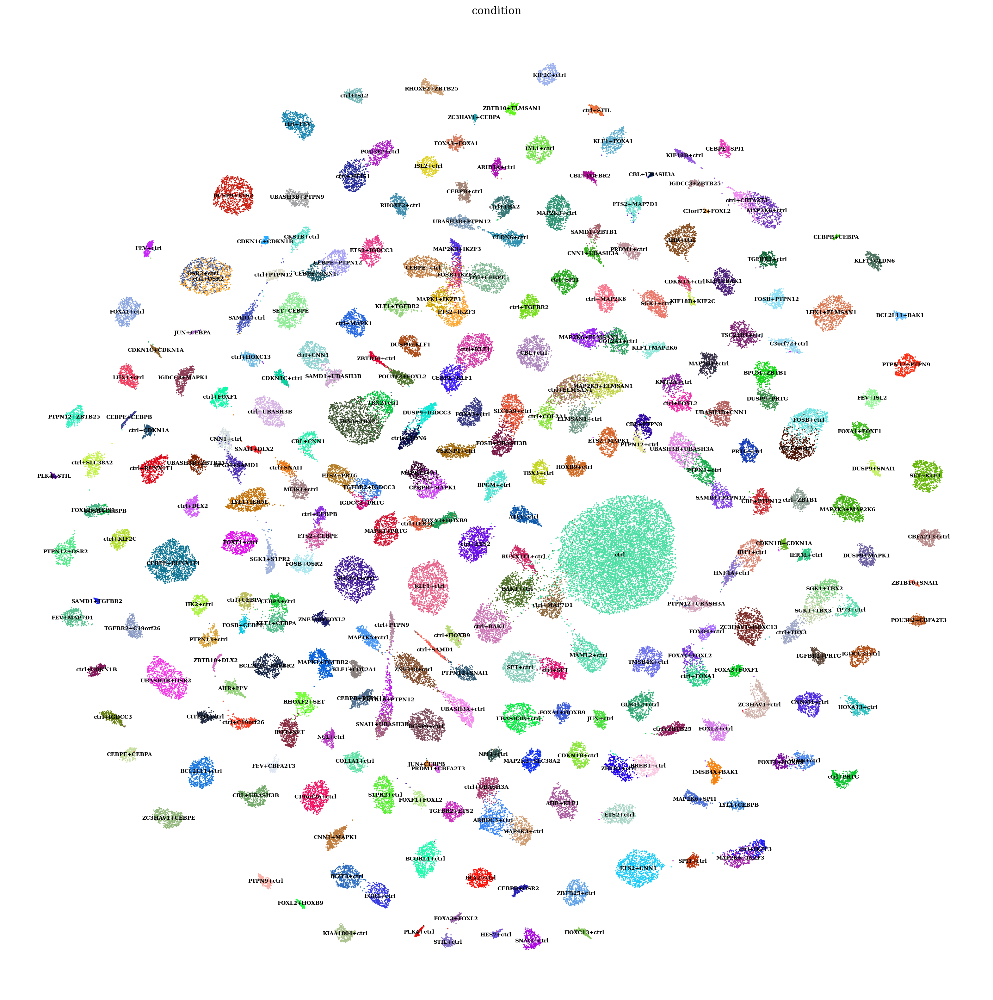

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

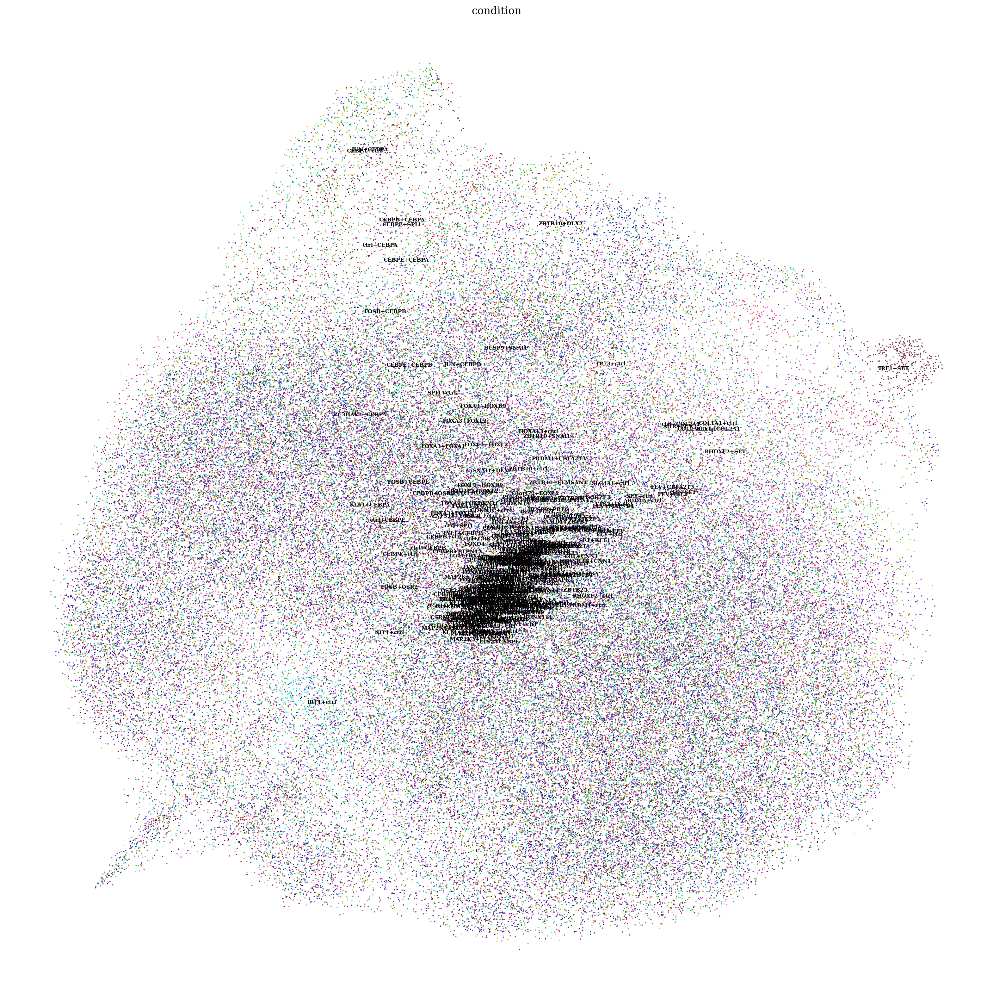

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()